In [154]:
#compare ORAS5, GODAS, Models new

In [1]:
import xarray as xr
import dask
import matplotlib.pyplot as plt
import numpy as np
import os


import matplotlib as mpl
import scipy
import glob as glob
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import calendar
import xskillscore as xs
from scipy.stats import iqr
import functools as ft


In [2]:
#loop to go through data folders. Do this in try except so that we know if/when somehting has failed, but the script will keep on running
datadir = '/home/z5113258/Documents/data/CMIP6_HB_new/'
#dict with file names
varis = {'dTdt':'_temp_tendency.nc', 'ua':'_u_advection.nc', 'va':'_v_advection.nc',
             'wa':'_w_advection.nc', 'q':'_qnet.nc', 'SST': '_tos.nc'}
models={}
#get all data for temp tendency
var = 'thetao/*.nc'
for model in os.listdir(datadir):
    #go thorugh all varis
    if model == 'NESM3':
        pass
    else:
        mod={}
        for key in varis.keys():
            #input file
            inp_files = (os.path.join(datadir, model, str(model+varis[key])))
            try:
                #load in file
                var = xr.open_dataarray(inp_files)
                #put into dict
                mod[key]=var
                models[model] = mod

            except Exception as e:
                print(e)
                pass
        #now append data to model dict
        #models[model] = mod



[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_temp_tendency.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_u_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_v_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_w_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_qnet.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_tos.nc'


In [3]:
models.keys()

dict_keys(['CanESM5', 'FGOALS-f3-L', 'CESM2-FV2', 'ACCESS-ESM1-5', 'MPI-ESM-1-2-HAM', 'CAMS-CSM1-0', 'CESM2', 'EC-Earth3-Veg-LR', 'MPI-ESM1-2-HR', 'EC-Earth3-CC', 'CMCC-CM2-HR4', 'MPI-ESM1-2-LR', 'EC-Earth3', 'CESM2-WACCM-FV2', 'ACCESS-CM2', 'EC-Earth3-Veg', 'FGOALS-g3', 'CESM2-WACCM', 'MRI-ESM2-0', 'EC-Earth3-AerChem'])

In [3]:
#loop to go through data folders. Do this in try except so that we know if/when somehting has failed, but the script will keep on running
datadir = '/home/z5113258/Documents/data/REAN_HB/'
#dict with file names
varis = {'dTdt':'_temp_tendency.nc', 'ua':'_u_advection.nc', 'va':'_v_advection.nc',
             'wa':'_w_advection.nc', 'q':'_qnet.nc', 'SST': '_tos.nc'}
OBS={}
#get all data for temp tendency
var = 'thetao/*.nc'
for model in os.listdir(datadir):
    #go thorugh all varis
    if model == 'NESM3':
        pass
    else:
        mod={}
        for key in varis.keys():
            #input file
            inp_files = (os.path.join(datadir, model, str(model+varis[key])))
            try:
                #load in file
                var = xr.open_dataarray(inp_files)
                #put into dict
                mod[key]=var
                OBS[model] = mod

            except Exception as e:
                print(e)
                pass
        #now append data to model dict
        #models[model] = mod



[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_temp_tendency.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_u_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_v_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_w_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_tos.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/ERA5/ERA5_temp_tendency.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/ERA5/ERA5_u_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/ERA5/ERA5_v_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/ERA5/ERA5_w_advection.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Doc

In [4]:
OBS.keys()

dict_keys(['OAFLUX', 'GODAS', 'SODA3.4.2', 'ERA5', 'ORAS5', 'ARGO'])

In [4]:
#delete obs from models dicts
del models['GODAS']
del models['ORAS5']
del models['SODA3.4.2']
del models['ARGO']
del models['not_full']

KeyError: 'GODAS'

In [6]:
#load in NOAAOISSTV2 and get temp tendency
OSST = xr.open_mfdataset('/home/z5113258/Documents/data/NOAA_OISSTv2.nc', parallel=True).sst
LSM = xr.open_dataset('/home/z5113258/Documents/data/LSM.nc').mask
OSST= OSST.where(LSM[0]).sel(lat=slice(-40,30),lon=slice(30,125))
Odt = OSST.differentiate(coord = 'time', edge_order=1,  datetime_unit= 's')
OSST = OSST.groupby('time.month').mean('time')
Odt = Odt.groupby('time.month').mean('time')
OAFQ = xr.open_mfdataset('/home/z5113258/Documents/data/OAFlux/OAflux_qnet.nc', parallel=True).qnet
e5_LH = xr.open_dataarray("/home/z5113258/Documents/data/REAN_HB/ERA5/ERA5_lhf.nc")
e5_SH = xr.open_dataarray("/home/z5113258/Documents/data/REAN_HB/ERA5/ERA5_shf.nc")
e5_SW = xr.open_dataarray("/home/z5113258/Documents/data/REAN_HB/ERA5/ERA5_swrf.nc")
e5_LW = xr.open_dataarray("/home/z5113258/Documents/data/REAN_HB/ERA5/ERA5_lwrf.nc")
E5Q = (e5_LW+e5_SW-e5_SH-e5_LH)

In [7]:
#now lets go through each model and produce and save a plot of the HB terms for Jan and July
def plot_background(ax, i, j):
    #for use with plotting 12 months. need to change 
    ax.set_extent([30., 125., -20., 20.])
    ax.add_feature(cfeature.COASTLINE.with_scale('50m'), linewidth=0.5)
    ax.add_feature(cfeature.LAND)
    gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
    gl.top_labels = False
    gl.right_labels = False
    if i == 1:
        gl.bottom_labels = True
    else:
        gl.bottom_labels = False
    if j > 0:
        gl.left_labels = False
    return ax

def plot_(dict_name, minv, maxv):
    fig, axes = plt.subplots(nrows=2, ncols=6, figsize=(20, 4), sharey='all', sharex='all', 
                             subplot_kw={'projection':ccrs.PlateCarree()})
    #unpack dict
    for num, key in enumerate(dict_name.keys()):
        var = dict_name[key]
        lons = var.lon
        lats = var.lat
        #dTdt
        axes[0,num].set_title(key)
        axi=0
        for i in [0, 6]:
            if i ==6:
                j = 1
            else:
                j = 0
            axes[j, num].pcolormesh(lons, lats, var.sel(month = (i+1)), 
                                #levels = 41, 
                                cmap = 'RdBu_r', 
                                #add_colorbar=True, 
                                vmin = minv, vmax = maxv, 
                                transform=ccrs.PlateCarree())
                
            plot_background(axes[j, num], j, num)
            axi=axi+1
    cbar_ax2 = fig.add_axes([0.95, 0.3, 0.01, 0.4])
    cmap2 = plt.cm.RdBu_r
    bounds = np.linspace(minv, maxv, 41)
    norm2 = mpl.colors.BoundaryNorm(bounds, cmap2.N)
    cb = mpl.colorbar.ColorbarBase(cbar_ax2, cmap=cmap2, norm=norm2,
        spacing='proportional', boundaries=bounds)
    axes[0, 0].text(-1.7,0.5, 'Jan')
    axes[1, 0].text(-1.7,0.5, 'July')
    #fig.tight_layout()
    return fig

In [8]:
#calculate residual, reverse sign on advection
models1={}
for model in models.keys():
    try:
        HB=models[model]
        T=HB['dTdt']
        U=HB['ua']
        V=HB['va']
        W=HB['wa']
        Q=HB['q']
        SST = HB['SST']
        resid = T-Q+U+V+W
        #repack dict
        HB1={'dTdt':T, 'ua':-U, 'va':-V,'wa':-W, 'q':Q, 'res':resid, 'SST':SST}
        models1[model]=HB1
    except Exception as e:
        print(e, model)
OBS1={}
for model in OBS.keys():
    try:
        HB=OBS[model]
        T=HB['dTdt']
        U=HB['ua']
        V=HB['va']
        W=HB['wa']
        Q=HB['q']
        SST = HB['SST']
        resid = T-Q+U+V+W
        #repack dict
        HB1={'dTdt':T, 'ua':-U, 'va':-V,'wa':-W, 'q':Q, 'res':resid, 'SST':SST}
        OBS1[model]=HB1
    except Exception as e:
        print(e, model)



'dTdt' OAFLUX
'dTdt' ERA5
'ua' ARGO


In [9]:
OBS1.keys()

dict_keys(['GODAS', 'SODA3.4.2', 'ORAS5'])

In [10]:
OBS['ARGO'].keys()

dict_keys(['dTdt', 'SST'])

index 6 is out of bounds for axis 1 with size 6
index 6 is out of bounds for axis 1 with size 6
index 6 is out of bounds for axis 1 with size 6


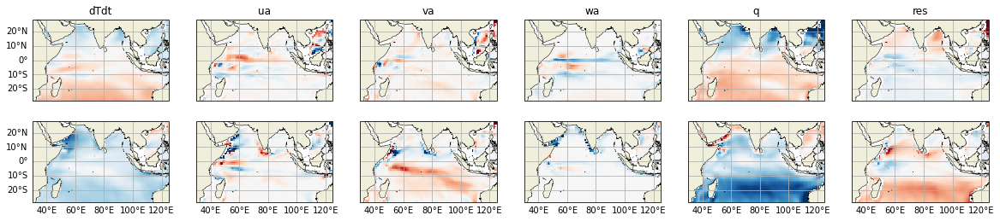

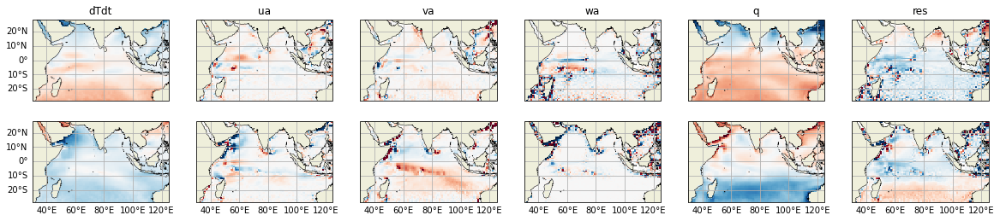

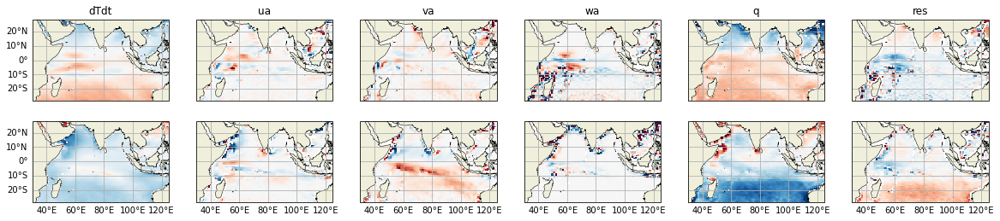

In [11]:
for model in OBS1.keys():
    try:
        fig = plot_(OBS1[model], -1e-6, 1e-6)
        fig.set_facecolor("w")
        fig.suptitle(model)
        fig.savefig('/home/z5113258/Documents/figures/multi_model/'+model+'.png')
    except Exception as e:
        print(e)

In [9]:
def get_region(da, lat, lat_r, lon, lon_r):
    DA_ss = da.sel(lat=slice(lat, lat_r),lon=slice(lon, lon_r)).mean(['lat', 'lon'])
    return DA_ss

In [10]:
def get_model_TS(MM_D):
    for i, model in enumerate(MM_D.keys()):
        HB = MM_D[model]
        T=HB['dTdt']
        U=HB['ua']
        V=HB['va']
        W=HB['wa']
        Q=HB['q']
        resid = HB['res']
        SST = HB['SST']

        T=T.assign_coords({'model':model})
        U=U.assign_coords({'model':model})
        V=V.assign_coords({'model':model})
        W=W.assign_coords({'model':model})
        Q=Q.assign_coords({'model':model})
        resid = resid.assign_coords({'model':model})
        SST = SST.assign_coords({'model':model})
        #now turn all these variables into an array
        if i == 0:
            TM = T
            UM = U
            VM = V
            WM = W
            QM = Q
            RM = resid
            SM = SST
        else:
            TM = xr.concat([TM, T], dim = 'model')
            UM = xr.concat([UM, U], dim = 'model')
            VM = xr.concat([VM, V], dim = 'model')
            WM = xr.concat([WM, W], dim = 'model')
            QM = xr.concat([QM, Q], dim = 'model')
            RM = xr.concat([RM, resid], dim = 'model')
            SM = xr.concat([SM, SST], dim = 'model')
    return TM, UM, VM, WM, QM, RM, SM

In [11]:
def get_obs_TS(MM_D):
    for i, model in enumerate(MM_D.keys()):
        print(i, model)
        HB = MM_D[model]
        T=HB['dTdt']
        U=HB['ua']
        V=HB['va']
        W=HB['wa']
        Q=HB['q']
        resid = HB['res']
        T=T.assign_coords({'model':model})
        U=U.assign_coords({'model':model})
        V=V.assign_coords({'model':model})
        W=W.assign_coords({'model':model})
        Q=Q.assign_coords({'model':model})
        resid = resid.assign_coords({'model':model})
        #now turn all these variables into an array
        if i == 0:
            TM = T
            UM = U
            VM = V
            WM = W
            QM = Q
            RM = resid
        else:
            TM = xr.concat([TM, T], dim = 'model')
            UM = xr.concat([UM, U], dim = 'model')
            VM = xr.concat([VM, V], dim = 'model')
            WM = xr.concat([WM, W], dim = 'model')
            QM = xr.concat([QM, Q], dim = 'model')
            RM = xr.concat([RM, resid], dim = 'model')
    
    return TM, UM, VM, WM, QM, RM

In [12]:
import pandas as pd

In [13]:
def get_TS_VALS(MODS, lat, lat1, lon, lon1):
    TM, UM, VM, WM, QM, RM, SM = get_model_TS(models1)
    SMM = SM.median(dim = 'model')
    TMM = TM.median(dim = 'model')
    UMM = UM.median(dim = 'model')
    VMM = VM.median(dim = 'model')
    WMM = WM.median(dim = 'model')
    QMM = QM.median(dim = 'model')
    RMM = RM.median(dim = 'model')
    SM_ = get_region((SMM), lat, lat1, lon, lon1)
    TM_ = get_region((TMM*(3986*1026*50)), lat, lat1, lon, lon1)
    QM_ = get_region((QMM*(3986*1026*50)),lat, lat1, lon, lon1)
    UM_ = get_region((UMM)*(3986*1026*50),lat, lat1, lon, lon1)
    VM_ = get_region((VMM)*(3986*1026*50),lat, lat1, lon, lon1)
    WM_ = get_region((WMM)*(3986*1026*50),lat, lat1, lon, lon1)
    RM_ = get_region((RMM)*(3986*1026*50), lat, lat1, lon, lon1)
    #NOW GET IQR
    T25 = get_region(((TM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat1, lon, lon1)
    T75 = get_region(((TM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat, lon, lon1)
    Q25 = get_region(((QM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat1, lon, lon1)
    Q75 = get_region(((QM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat1, lon, lon1)
    U25 = get_region(((UM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat1, lon, lon1)
    U75 = get_region(((UM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat1, lon, lon1)
    V25 = get_region(((VM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat1, lon, lon1)
    V75 = get_region(((VM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat1, lon, lon1)
    W25 = get_region(((WM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat1, lon, lon1)
    W75 = get_region(((WM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat1, lon, lon1)
    R25 = get_region(((RM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat1, lon, lon1)
    R75 = get_region(((RM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat1, lon, lon1)
    S25 = get_region(((SM.quantile(0.25, 'model'))), lat, lat1, lon, lon1)
    S75 = get_region(((SM.quantile(0.75, 'model'))), lat, lat1, lon, lon1)
    ###now convert all vars to DFS
    SM = SM_.rename("SST").to_dataframe()
    TM = TM_.rename("dTdt").to_dataframe()
    QM = QM_.rename("Qnet").to_dataframe()
    UM = UM_.rename("Uadv").to_dataframe()
    VM = VM_.rename("Vadv").to_dataframe()
    WM = WM_.rename("Wadv").to_dataframe()
    RM = RM_.rename("Residual").to_dataframe()
    #Now join DFS on month
    dfs_m = [SM, TM, QM, UM, VM, WM, RM]
    df_MM = ft.reduce(lambda left, right: pd.merge(left, right, on='month'), dfs_m)
    
    ###now convert all vars to DFS for 25 %
    SM = S25.rename("SST").to_dataframe()
    TM = T25.rename("dTdt").to_dataframe()
    QM = Q25.rename("Qnet").to_dataframe()
    UM = U25.rename("Uadv").to_dataframe()
    VM = V25.rename("Vadv").to_dataframe()
    WM = W25.rename("Wadv").to_dataframe()
    RM = R25.rename("Residual").to_dataframe()
    #Now join DFS on month
    dfs_25 = [SM, TM, QM, UM, VM, WM, RM]
    df_25 = ft.reduce(lambda left, right: pd.merge(left, right, on='month'), dfs_25)
    ###now convert all vars to DFS for 75 %
    SM = S75.rename("SST").to_dataframe()
    TM = T75.rename("dTdt").to_dataframe()
    QM = Q75.rename("Qnet").to_dataframe()
    UM = U75.rename("Uadv").to_dataframe()
    VM = V75.rename("Vadv").to_dataframe()
    WM = W75.rename("Wadv").to_dataframe()
    RM = R75.rename("Residual").to_dataframe()
    #Now join DFS on month
    dfs_75 = [SM, TM, QM, UM, VM, WM, RM]
    df_75 = ft.reduce(lambda left, right: pd.merge(left, right, on='month'), dfs_75)
    return df_MM, df_25, df_75 

In [14]:
WTMM, W25, W75 = get_TS_VALS(models1, -10, 10, 50, 75)

/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/na

In [22]:
WTMM.to_csv("/home/z5113258/Documents/data/region_csv/WTIO_MMM.csv")
W25.to_csv("/home/z5113258/Documents/data/region_csv/WTIO_25.csv")
W75.to_csv("/home/z5113258/Documents/data/region_csv/WTIO_75.csv")

In [23]:
SEMM, S25, S75 = get_TS_VALS(models1, -10, 0, 90, 110)

/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/na

In [24]:
SEMM.to_csv("/home/z5113258/Documents/data/region_csv/SETIO_MMM.csv")
S25.to_csv("/home/z5113258/Documents/data/region_csv/SETIO_25.csv")
S75.to_csv("/home/z5113258/Documents/data/region_csv/SETIO_75.csv")

In [25]:
ASMM, AS25, AS75 = get_TS_VALS(models1, 10, 20, 50, 70)

/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/na

In [26]:
ASMM.to_csv("/home/z5113258/Documents/data/region_csv/AS_MMM.csv")
AS25.to_csv("/home/z5113258/Documents/data/region_csv/AS_25.csv")
AS75.to_csv("/home/z5113258/Documents/data/region_csv/AS_75.csv")

In [ ]:
####Now load in Each reanalsyis dataset and put them into the csv's
#ERA5


In [42]:
#fucntion to create regional plots for multimodel mean of each variable
def plot_region_MM(MM_D, OBS_D, lat, lat_r, lon, lon_r):
    #create a 'model-series' for each variable
    TM, UM, VM, WM, QM, RM = get_model_TS(MM_D)
    TO, UO, VO, WO, QO, RO = get_model_TS(OBS_D)

    #Now calculate the multimodel means/
    TMM = TM.median(dim = 'model')
    UMM = UM.median(dim = 'model')
    VMM = VM.median(dim = 'model')
    WMM = WM.median(dim = 'model')
    QMM = QM.median(dim = 'model')
    RMM = RM.median(dim = 'model')
    #get the spatial average of these
    #TM = get_region(TM, lat, lat_r, lon, lon_r)
    #NOW LETS PLOT
    fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(18, 4), sharey='all', sharex='all')
    fig.set_facecolor('white')
    axes[0].plot(range(1,13), get_region((TMM*(3986*1026*50)), lat, lat_r, lon, lon_r), label = 'CMIP6 Multimodel Median')
    axes[1].plot(range(1,13), get_region((QMM*(3986*1026*50)), lat, lat_r, lon, lon_r), label = 'Qnet')
    axes[2].plot(range(1,13), get_region((UMM)*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-U Advection')
    axes[3].plot(range(1,13), get_region((VMM)*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-V Advection')
    axes[4].plot(range(1,13), get_region((WMM)*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-W Advection')
    axes[5].plot(range(1,13), get_region((RMM)*(3986*1026*50), lat, lat_r, lon, lon_r), label = 'CMIP6 Multimodel Median')
    
    for i in [0,1,2]:
        axes[0].plot(range(1,13), get_region((TO[i]*(3986*1026*50)), lat, lat_r, lon, lon_r), label = TO.model.values[i])
        axes[1].plot(range(1,13), get_region((QO[i]*(3986*1026*50)), lat, lat_r, lon, lon_r), label = 'Qnet')
        axes[2].plot(range(1,13), get_region((UO[i])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-U Advection')
        axes[3].plot(range(1,13), get_region((VO[i])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-V Advection')
        axes[4].plot(range(1,13), get_region((WO[i])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-W Advection')
        axes[5].plot(range(1,13), get_region((RO[i])*(3986*1026*50), lat, lat_r, lon, lon_r), label = RO.model.values[i])
    #add in NOASSIOSSTV2
    axes[0].plot(range(1,13), get_region((Odt*(3986*1026*50)), lat, lat_r, lon, lon_r), label = 'NOAA OiSSTv2')

    axes[0].legend(bbox_to_anchor=(7.05, 1), loc='upper left')
    axes[0].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[1].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[2].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[3].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[4].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[5].axhline(0, c='k', ls = '--', lw = 0.5)

    #now plot ranges
    axes[0].fill_between(range(1,13), get_region(((TM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((TM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, label = 'Temperature tendency')
    axes[1].fill_between(range(1,13), get_region(((QM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((QM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, label = 'Qnet')
    axes[2].fill_between(range(1,13), get_region(((UM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((UM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, label = 'U advection')
    axes[3].fill_between(range(1,13), get_region(((VM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((VM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, label = 'V Advection')
    axes[4].fill_between(range(1,13), get_region(((WM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((WM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, label = 'W advection')
    axes[5].fill_between(range(1,13), get_region(((RM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((RM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, label = 'Residual')
    

    axes[0].set_xticks(range(2,14,2))
    
    axes[0].set_title('$dT/dt$')
    axes[1].set_title('$Q_{net}$')
    axes[2].set_title('$Advection_{u}$')
    axes[3].set_title('$Advection_{v}$')
    axes[4].set_title('$Advection_{w}$')
    axes[5].set_title('$Residual$')

    return fig

In [43]:
#fucntion to create regional plots for multimodel mean of each variable with SST
def plot_region_MM(MM_D, OBS_D, lat, lat_r, lon, lon_r):
    #create a 'model-series' for each variable
    TM, UM, VM, WM, QM, RM, SM = get_model_TS(MM_D)
    TO, UO, VO, WO, QO, RO, SO = get_model_TS(OBS_D)

    #Now calculate the multimodel means/
    TMM = TM.median(dim = 'model')
    UMM = UM.median(dim = 'model')
    VMM = VM.median(dim = 'model')
    WMM = WM.median(dim = 'model')
    QMM = QM.median(dim = 'model')
    RMM = RM.median(dim = 'model')
    SMM = SM.median(dim = 'model')
    #get the spatial average of these
    #TM = get_region(TM, lat, lat_r, lon, lon_r)
    #NOW LETS PLOT
    fig, axes = plt.subplots(nrows=1, ncols=7, figsize=(30, 8),  sharex='all')
    fig.set_facecolor('white')
    axes[0].plot(range(1,13), get_region((SMM), lat, lat_r, lon, lon_r), linestyle='-', marker='o',  label = 'CMIP6 Multimodel Median')

    axes[1].plot(range(1,13), get_region((TMM*(3986*1026*50)), lat, lat_r, lon, lon_r), linestyle='-', marker='o', label = 'CMIP6 Multimodel Median')
    axes[2].plot(range(1,13), get_region((QMM*(3986*1026*50)), lat, lat_r, lon, lon_r), linestyle='-', marker='o', label = 'Qnet')
    axes[3].plot(range(1,13), get_region((UMM)*(3986*1026*50), lat, lat_r, lon, lon_r), linestyle='-', marker='o',label = '-U Advection')
    axes[4].plot(range(1,13), get_region((VMM)*(3986*1026*50), lat, lat_r, lon, lon_r),  linestyle='-', marker='o',label = '-V Advection')
    axes[5].plot(range(1,13), get_region((WMM)*(3986*1026*50), lat, lat_r, lon, lon_r),  linestyle='-', marker='o',label = '-W Advection')
    axes[6].plot(range(1,13), get_region((RMM)*(3986*1026*50), lat, lat_r, lon, lon_r), linestyle='-', marker='o',label = 'CMIP6 Multimodel Median')
    
    for i in [0,1,2]:
        axes[0].plot(range(1,13), get_region((SO[i]), lat, lat_r, lon, lon_r),alpha = 0.75, linestyle='-', marker='.', linewidth = 0.5, label = SO.model.values[i])
        axes[1].plot(range(1,13), get_region((TO[i]*(3986*1026*50)), lat, lat_r, lon, lon_r),alpha = 0.75,  marker='.', linewidth = 0.5, label = TO.model.values[i])
        axes[2].plot(range(1,13), get_region((QO[i]*(3986*1026*50)), lat, lat_r, lon, lon_r),alpha = 0.75, marker='.', linewidth = 0.5, label = 'Qnet')
        axes[3].plot(range(1,13), get_region((UO[i])*(3986*1026*50), lat, lat_r, lon, lon_r),alpha = 0.75, marker='.', linewidth = 0.5,  label = '-U Advection')
        axes[4].plot(range(1,13), get_region((VO[i])*(3986*1026*50), lat, lat_r, lon, lon_r),alpha = 0.75,  marker='.', linewidth = 0.5, label = '-V Advection')
        axes[5].plot(range(1,13), get_region((WO[i])*(3986*1026*50), lat, lat_r, lon, lon_r),alpha = 0.75,  marker='.', linewidth = 0.5, label = '-W Advection')
        axes[6].plot(range(1,13), get_region((RO[i])*(3986*1026*50), lat, lat_r, lon, lon_r),alpha = 0.75,  marker='.', linewidth = 0.5, label = RO.model.values[i])
    #add in NOASSIOSSTV2
    axes[1].plot(range(1,13), get_region((Odt*(3986*1026*50)), lat, lat_r, lon, lon_r), color = 'tab:purple',  marker='o', linewidth = 0.5,  label = 'NOAA OiSSTv2')
    axes[0].plot(range(1,13), get_region((OSST), lat, lat_r, lon, lon_r), color = 'tab:purple', marker='o', linewidth = 0.5, label = 'NOAA OiSSTv2')
    #add in ARGO
    axes[1].plot(range(1,13), get_region((OBS['ARGO']['dTdt']*(3986*1026*50)), lat, lat_r, lon, lon_r), color = 'tab:olive',  marker='o', linewidth = 0.5,  label = 'ARGO')
    axes[0].plot(range(1,13), get_region((OBS['ARGO']['SST']), lat, lat_r, lon, lon_r), color = 'tab:olive', marker='o', linewidth = 0.5,  label = 'ARGO')
    #add in OAFLUX
    axes[2].plot(range(1,13), get_region((OAFQ), lat, lat_r, lon, lon_r), color = 'tab:pink', marker='o', linewidth = 0.5,  label = 'OAFlux')
    #add in ERA5
    axes[2].plot(range(1,13), get_region((E5Q), lat, lat_r, lon, lon_r), color = 'tab:brown', marker='o', linewidth = 0.5,  label = 'OAFlux')

    axes[1].legend(bbox_to_anchor=(7.05, 1), loc='upper left')
    from matplotlib.lines import Line2D
    custom_lines = [Line2D([0], [0], color='tab:blue', lw=2, marker='o'),
                    Line2D([0], [0], color='tab:orange', lw=2, marker='.'),
                    Line2D([0], [0], color='tab:green', lw=1, marker='.'),
                    Line2D([0], [0], color='tab:red', lw=1, marker='.'),
                    Line2D([0], [0], color='tab:purple', lw=1, marker='o'),
                    Line2D([0], [0], color='tab:olive', lw=1, marker='o'),
                    Line2D([0], [0], color='tab:pink', lw=1, marker='o'),
                    Line2D([0], [0], color='tab:brown', lw=1, marker='o')]

    custom_labels = ['CMIP6 Multimodel median', 'GODAS', 'ORAS5', 'SODA3.4.2', 'NOAAOiSSTv2', 'ARGO',
                     'OAFlux', 'ERA5']
    axes[1].legend(custom_lines, custom_labels, bbox_to_anchor=(7.05, 1), loc='upper left')
    
    
    #axes[0].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[1].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[2].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[3].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[4].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[5].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[6].axhline(0, c='k', ls = '--', lw = 0.5)

    #now plot ranges
    axes[0].fill_between(range(1,13), get_region(((SM.quantile(0.25, 'model'))), lat, lat_r, lon, lon_r),
                      get_region(((SM.quantile(0.75, 'model'))), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, color='tab:blue', label = 'Temperature tendency')
    
    axes[1].fill_between(range(1,13), get_region(((TM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((TM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, color='tab:blue',label = 'Temperature tendency')
    axes[2].fill_between(range(1,13), get_region(((QM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((QM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, color='tab:blue', label = 'Qnet')
    axes[3].fill_between(range(1,13), get_region(((UM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((UM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, color='tab:blue', label = 'U advection')
    axes[4].fill_between(range(1,13), get_region(((VM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((VM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, color='tab:blue', label = 'V Advection')
    axes[5].fill_between(range(1,13), get_region(((WM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((WM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, color='tab:blue', label = 'W advection')
    axes[6].fill_between(range(1,13), get_region(((RM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((RM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, color='tab:blue', label = 'Residual')
    

    axes[0].set_xticks(range(2,14,2))
    axes[0].set_title('a) $SST$')

    axes[1].set_title('b) $dT/dt$')
    axes[2].set_title('c) $Q_{net}$')
    axes[3].set_title('d) $Advection_{u}$')
    axes[4].set_title('e) $Advection_{v}$')
    axes[5].set_title('f) $Advection_{w}$')
    axes[6].set_title('g) $Residual$')
    
    axes[1].get_shared_y_axes().join(axes[1], axes[2], axes[3],axes[4], axes[5],axes[6])
    
    return fig

In [14]:
#fucntion to create regional plots for multimodel mean of each variable with SST
def plot_region_MM_new(MM_D, OBS_D, lat, lat_r, lon, lon_r):
    #create a 'model-series' for each variable
    TM, UM, VM, WM, QM, RM, SM = get_model_TS(MM_D)
    TO, UO, VO, WO, QO, RO, SO = get_model_TS(OBS_D)

    #Now calculate the multimodel means/
    TMM = TM.median(dim = 'model')
    UMM = UM.median(dim = 'model')
    VMM = VM.median(dim = 'model')
    WMM = WM.median(dim = 'model')
    QMM = QM.median(dim = 'model')
    RMM = RM.median(dim = 'model')
    SMM = SM.median(dim = 'model')
    #get the spatial average of these
    #TM = get_region(TM, lat, lat_r, lon, lon_r)
    #NOW LETS PLOT
    fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(32, 16),  sharex='all')
    fig.set_facecolor('white')
    axes[0,0].plot(range(1,13), get_region((SMM), lat, lat_r, lon, lon_r), linestyle='-', marker='o',  label = 'CMIP6 Multimodel Median')

    axes[0,1].plot(range(1,13), get_region((TMM*(3986*1026*50)), lat, lat_r, lon, lon_r), linestyle='-', marker='o', label = 'CMIP6 Multimodel Median')
    axes[0,2].plot(range(1,13), get_region((QMM*(3986*1026*50)), lat, lat_r, lon, lon_r), linestyle='-', marker='o', label = 'Qnet')
    axes[1,0].plot(range(1,13), get_region((UMM)*(3986*1026*50), lat, lat_r, lon, lon_r), linestyle='-', marker='o',label = '-U Advection')
    axes[1,1].plot(range(1,13), get_region((VMM)*(3986*1026*50), lat, lat_r, lon, lon_r),  linestyle='-', marker='o',label = '-V Advection')
    axes[1,2].plot(range(1,13), get_region((WMM)*(3986*1026*50), lat, lat_r, lon, lon_r),  linestyle='-', marker='o',label = '-W Advection')
    axes[1,3].plot(range(1,13), get_region((RMM)*(3986*1026*50), lat, lat_r, lon, lon_r), linestyle='-', marker='o',label = 'CMIP6 Multimodel Median')
    
    for i in [0,1,2]:
        axes[0,0].plot(range(1,13), get_region((SO[i]), lat, lat_r, lon, lon_r),alpha = 0.75, linestyle='-', marker='.', linewidth = 0.5, label = SO.model.values[i])
        axes[0,1].plot(range(1,13), get_region((TO[i]*(3986*1026*50)), lat, lat_r, lon, lon_r),alpha = 0.75,  marker='.', linewidth = 0.5, label = TO.model.values[i])
        axes[0,2].plot(range(1,13), get_region((QO[i]*(3986*1026*50)), lat, lat_r, lon, lon_r),alpha = 0.75, marker='.', linewidth = 0.5, label = 'Qnet')
        axes[1,0].plot(range(1,13), get_region((UO[i])*(3986*1026*50), lat, lat_r, lon, lon_r),alpha = 0.75, marker='.', linewidth = 0.5,  label = '-U Advection')
        axes[1,1].plot(range(1,13), get_region((VO[i])*(3986*1026*50), lat, lat_r, lon, lon_r),alpha = 0.75,  marker='.', linewidth = 0.5, label = '-V Advection')
        axes[1,2].plot(range(1,13), get_region((WO[i])*(3986*1026*50), lat, lat_r, lon, lon_r),alpha = 0.75,  marker='.', linewidth = 0.5, label = '-W Advection')
        axes[1,3].plot(range(1,13), get_region((RO[i])*(3986*1026*50), lat, lat_r, lon, lon_r),alpha = 0.75,  marker='.', linewidth = 0.5, label = RO.model.values[i])
    #add in NOASSIOSSTV2
    axes[0,1].plot(range(1,13), get_region((Odt*(3986*1026*50)), lat, lat_r, lon, lon_r), color = 'tab:purple',  marker='o', linewidth = 0.5,  label = 'NOAA OiSSTv2')
    axes[0,0].plot(range(1,13), get_region((OSST), lat, lat_r, lon, lon_r), color = 'tab:purple', marker='o', linewidth = 0.5, label = 'NOAA OiSSTv2')
    #add in ARGO
    axes[0,1].plot(range(1,13), get_region((OBS['ARGO']['dTdt']*(3986*1026*50)), lat, lat_r, lon, lon_r), color = 'tab:olive',  marker='o', linewidth = 0.5,  label = 'ARGO')
    axes[0,0].plot(range(1,13), get_region((OBS['ARGO']['SST']), lat, lat_r, lon, lon_r), color = 'tab:olive', marker='o', linewidth = 0.5,  label = 'ARGO')
    #add in OAFLUX
    axes[0,2].plot(range(1,13), get_region((OAFQ), lat, lat_r, lon, lon_r), color = 'tab:pink', marker='o', linewidth = 0.5,  label = 'OAFlux')
    #add in ERA5
    axes[0,2].plot(range(1,13), get_region((E5Q), lat, lat_r, lon, lon_r), color = 'tab:brown', marker='o', linewidth = 0.5,  label = 'OAFlux')
    axes[0,3].set_axis_off()
    from matplotlib.lines import Line2D
    custom_lines = [Line2D([0], [0], color='tab:blue', lw=2, marker='o'),
                    Line2D([0], [0], color='tab:orange', lw=2, marker='.'),
                    Line2D([0], [0], color='tab:green', lw=1, marker='.'),
                    Line2D([0], [0], color='tab:red', lw=1, marker='.'),
                    Line2D([0], [0], color='tab:purple', lw=1, marker='o'),
                    Line2D([0], [0], color='tab:olive', lw=1, marker='o'),
                    Line2D([0], [0], color='tab:pink', lw=1, marker='o'),
                    Line2D([0], [0], color='tab:brown', lw=1, marker='o')]

    custom_labels = ['CMIP6 Multimodel median', 'GODAS', 'ORAS5', 'SODA3.4.2', 'NOAAOiSSTv2', 'ARGO',
                     'OAFlux', 'ERA5']
    axes[0,3].legend(custom_lines, custom_labels, loc = 'center')
    
    
    #axes[0].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[0,1].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[0,2].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[1,0].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[1,1].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[1,2].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[1,3].axhline(0, c='k', ls = '--', lw = 0.5)

    #now plot ranges
    axes[0,0].fill_between(range(1,13), get_region(((SM.quantile(0.25, 'model'))), lat, lat_r, lon, lon_r),
                      get_region(((SM.quantile(0.75, 'model'))), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, color='tab:blue', label = 'Temperature tendency')
    
    axes[0,1].fill_between(range(1,13), get_region(((TM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((TM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, color='tab:blue',label = 'Temperature tendency')
    axes[0,2].fill_between(range(1,13), get_region(((QM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((QM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, color='tab:blue', label = 'Qnet')
    axes[1,0].fill_between(range(1,13), get_region(((UM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((UM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, color='tab:blue', label = 'U advection')
    axes[1,1].fill_between(range(1,13), get_region(((VM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((VM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, color='tab:blue', label = 'V Advection')
    axes[1,2].fill_between(range(1,13), get_region(((WM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((WM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, color='tab:blue', label = 'W advection')
    axes[1,3].fill_between(range(1,13), get_region(((RM.quantile(0.25, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r),
                      get_region(((RM.quantile(0.75, 'model'))*(3986*1026*50)), lat, lat_r, lon, lon_r), 
                      alpha = 0.25, color='tab:blue', label = 'Residual')
    

    axes[0,0].set_xticks(range(2,14,2))
    axes[0,0].set_title('a) $SST$')

    axes[0,1].set_title('b) $dT/dt$')
    axes[0,2].set_title('c) $Q_{net}$')
    axes[1,0].set_title('d) $Advection_{u}$')
    axes[1,1].set_title('e) $Advection_{v}$')
    axes[1,2].set_title('f) $Advection_{w}$')
    axes[1,3].set_title('g) $Residual$')
    
    axes[0,1].get_shared_y_axes().join(axes[0,1], axes[0,2], axes[1,0],axes[1,1], axes[1,2],axes[1,3])
    
    return fig

/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning

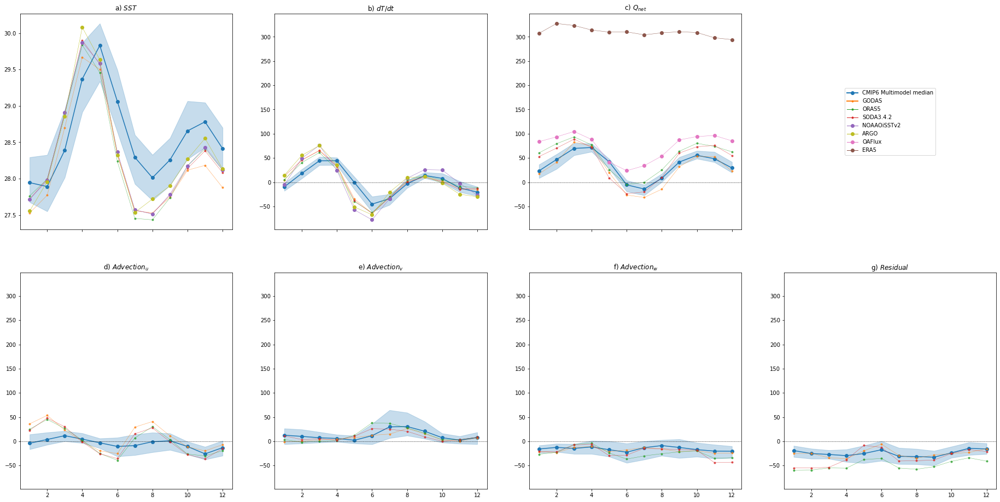

In [15]:
a = plot_region_MM_new(models1, OBS1,-3, 3, 40,70)#WTIO equator

/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning

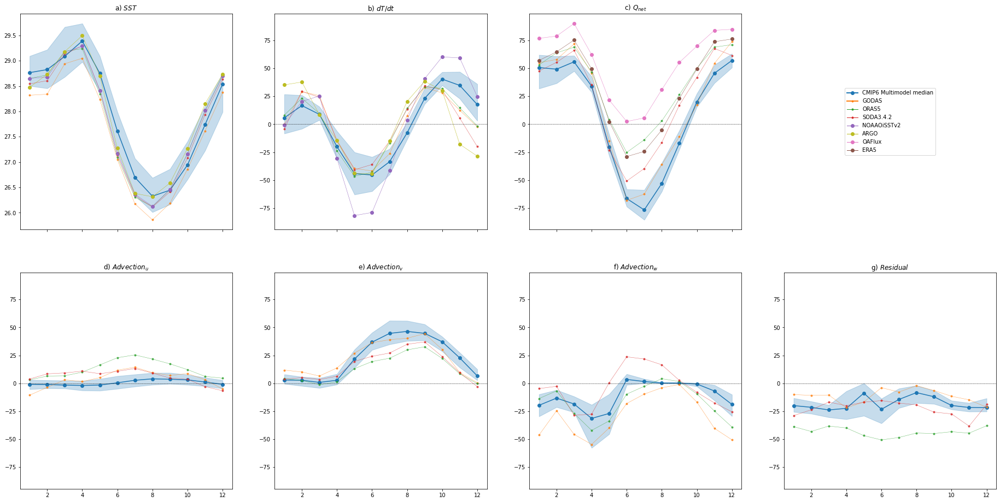

In [60]:
a = plot_region_MM_new(models1, OBS1,-10, -7, 50,70)#Thermocline Ridge ORAS5

/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning

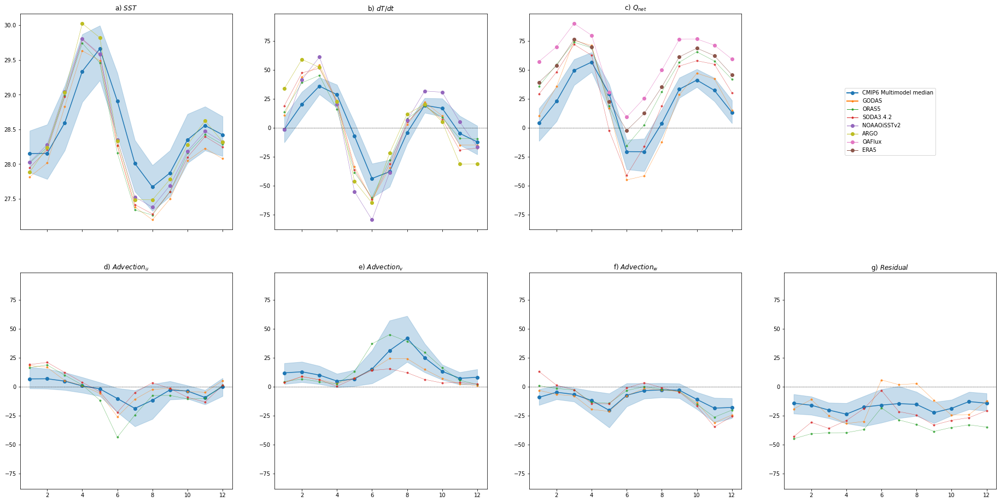

In [65]:
a = plot_region_MM_new(models1, OBS1,-10, 10, 50,70)#WTIO GODAS#QNETNEW

/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning

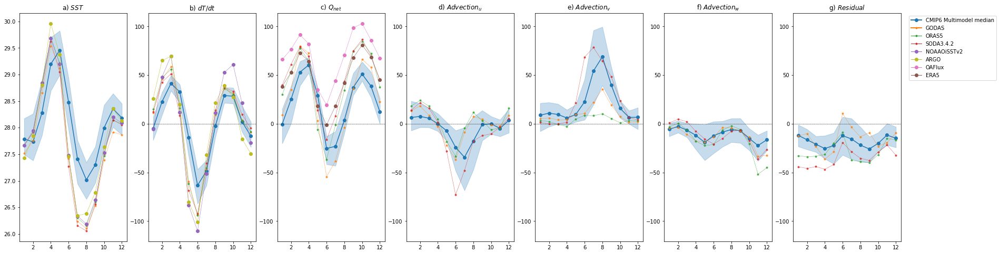

In [189]:
a = plot_region_MM(models1, OBS1,-10, 10, 45,60)#WTIO GODAS

/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning

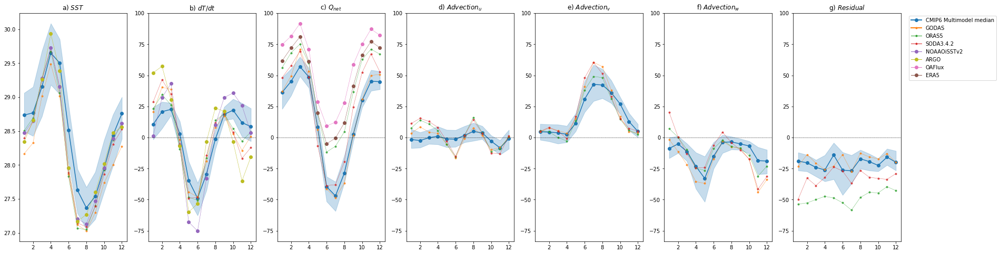

In [23]:
a = plot_region_MM(models1, OBS1,-10, 0, 50,70)#WTIO GODAS_NORTH

/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning

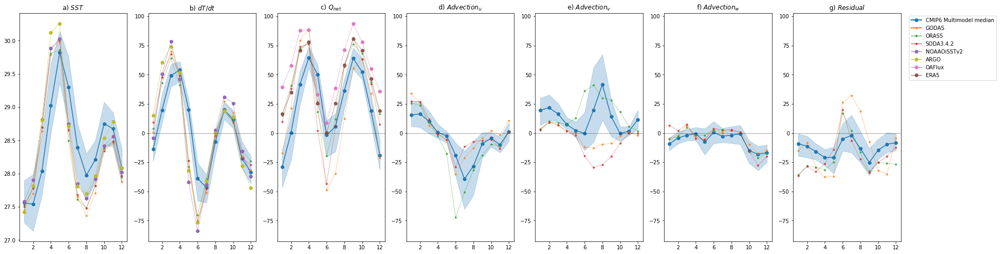

In [22]:
a = plot_region_MM(models1, OBS1,0, 10, 50,70)#WTIO GODAS_south

/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning

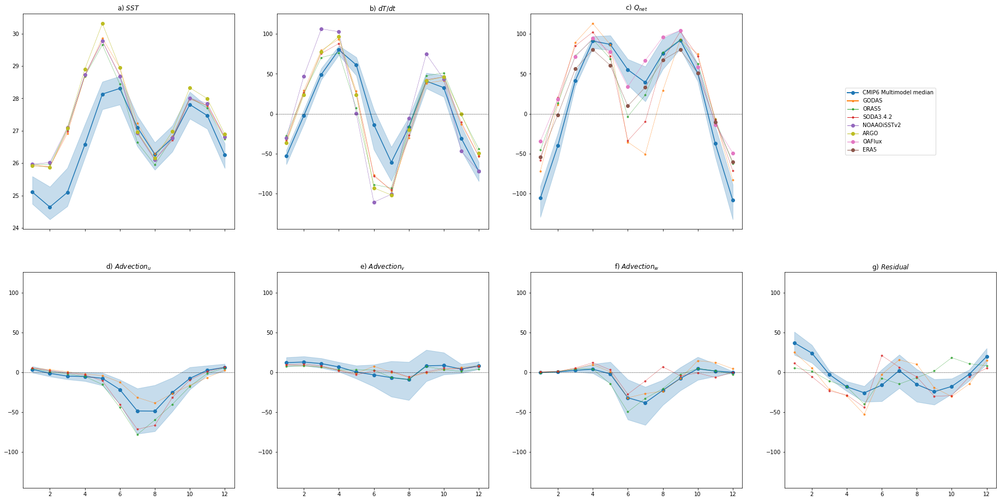

In [66]:
a = plot_region_MM_new(models1, OBS1,10, 20, 50,70)#Arab sea

/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning

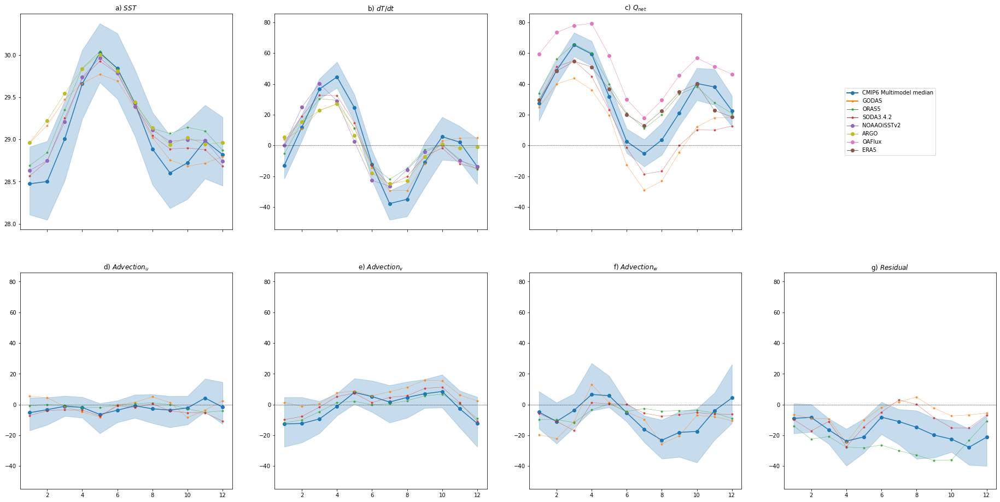

In [67]:
a = plot_region_MM_new(models1, OBS1,-5, 5, 90,110)#SETIO GODAS

/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning

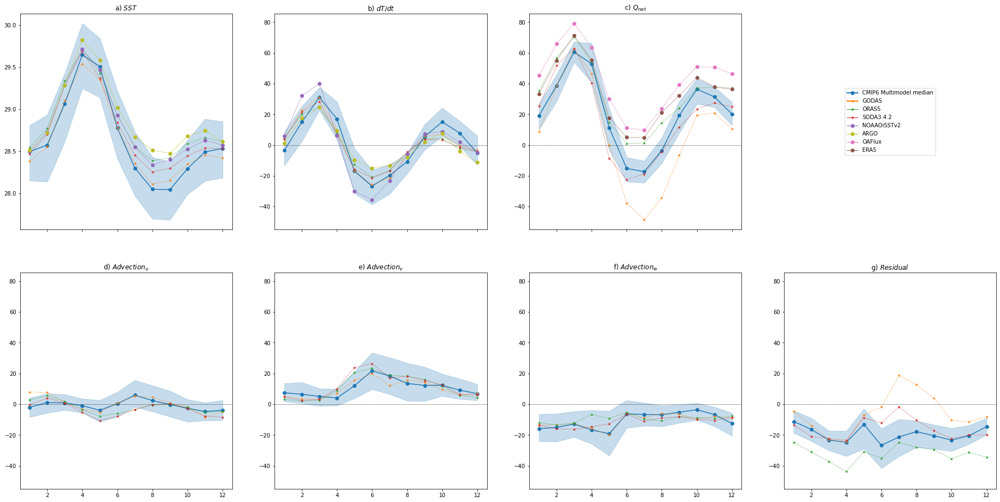

In [68]:
a = plot_region_MM_new(models1, OBS1,-10, 10, 70,90)#Equator

In [17]:
def plot_1(dict_name, minv, maxv):
    fig, axes = plt.subplots(nrows=12, ncols=6, figsize=(20, 24), sharey='all', sharex='all', 
                             subplot_kw={'projection':ccrs.PlateCarree()})
    #unpack dict
    for num, key in enumerate(dict_name.keys()):
        var = dict_name[key]
        lons = var.lon
        lats = var.lat
        #dTdt
        axes[0,num].set_title(key)
        axi=0
        for i in range(0,12,1):
            axes[axi, num].pcolormesh(lons, lats, var.sel(month = (i+1)), 
                                #levels = 41, 
                                cmap = 'jet', 
                                #add_colorbar=True, 
                                vmin = minv, vmax = maxv, 
                                transform=ccrs.PlateCarree())
                
            plot_background(axes[axi, num], axi, num)
            axi=axi+1
    cbar_ax2 = fig.add_axes([0.95, 0.3, 0.01, 0.4])
    cmap2 = plt.cm.jet
    bounds = np.linspace(minv, maxv, 41)
    norm2 = mpl.colors.BoundaryNorm(bounds, cmap2.N)
    cb = mpl.colorbar.ColorbarBase(cbar_ax2, cmap=cmap2, norm=norm2,
        spacing='proportional', boundaries=bounds)
    axes[0, 0].text(-1.7,0.5, 'Jan')
    axes[6, 0].text(-1.7,0.5, 'July')
    #fig.tight_layout()
    return fig

In [18]:
#lok at temp gradients and currents
#loop to go through data folders. Do this in try except so that we know if/when somehting has failed, but the script will keep on running
datadir = '/home/z5113258/Documents/data/CMIP6_HB_new/'
#dict with file names
varis = {'dtdx':'_dtx.nc', 'dtdy':'_dty.nc', 'dtdz':'_dtz.nc',
             'wcur':'_wcur.nc', 'vcur':'_vcur.nc', 'ucur':'_ucur.nc'}
models2={}
#get all data for temp tendency
var = 'thetao/*.nc'
for model in os.listdir(datadir):
    #go thorugh all varis
    if model == 'NESM3':
        pass
    else:
        mod={}
        for key in varis.keys():
            #input file
            inp_files = (os.path.join(datadir, model, str(model+varis[key])))
            try:
                #load in file
                var = xr.open_dataarray(inp_files)
                if key == 'wcur':
                    var = var.groupby('time.month').mean('time')
                #put into dict
                mod[key]=var
                models2[model] = mod
            except Exception as e:
                print(e)
                pass
        #now append data to model dict


[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_dtx.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_dty.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_dtz.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_wcur.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_vcur.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_ucur.nc'


In [19]:
#lok at temp gradients and currents
#loop to go through data folders. Do this in try except so that we know if/when somehting has failed, but the script will keep on running
datadir = '/home/z5113258/Documents/data/REAN_HB/'
#dict with file names
varis = {'dtdx':'_dtx.nc', 'dtdy':'_dty.nc', 'dtdz':'_dtz.nc',
             'wcur':'_wcur.nc', 'vcur':'_vcur.nc', 'ucur':'_ucur.nc'}
OBS2={}
#get all data for temp tendency
var = 'thetao/*.nc'
for model in os.listdir(datadir):
    #go thorugh all varis
    if model == 'NESM3':
        pass
    else:
        mod={}
        for key in varis.keys():
            #input file
            inp_files = (os.path.join(datadir, model, str(model+varis[key])))
            try:
                #load in file
                var = xr.open_dataarray(inp_files)
                #if key == 'wcur':
                #    var = var.groupby('time.month').mean('time')
                #put into dict
                mod[key]=var
                OBS2[model] = mod
            except Exception as e:
                print(e)
                pass
        #now append data to model dict


[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_dtx.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_dty.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_dtz.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_wcur.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_vcur.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/OAFLUX/OAFLUX_ucur.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/ERA5/ERA5_dtx.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/ERA5/ERA5_dty.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/ERA5/ERA5_dtz.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/REAN_HB/ERA5/ERA5_wcur.nc'
[Errno 2] No such file

In [20]:
models2.keys()

dict_keys(['CanESM5', 'FGOALS-f3-L', 'CESM2-FV2', 'ACCESS-ESM1-5', 'MPI-ESM-1-2-HAM', 'CAMS-CSM1-0', 'CESM2', 'EC-Earth3-Veg-LR', 'MPI-ESM1-2-HR', 'EC-Earth3-CC', 'CMCC-CM2-HR4', 'MPI-ESM1-2-LR', 'EC-Earth3', 'CESM2-WACCM-FV2', 'ACCESS-CM2', 'EC-Earth3-Veg', 'FGOALS-g3', 'CESM2-WACCM', 'MRI-ESM2-0', 'EC-Earth3-AerChem'])

In [21]:
for i, model in enumerate(models2.keys()):
    try:
        HB = models2[model]
        tx=HB['dtdx']
        ty=HB['dtdy']
        tz=HB['dtdz']
        u=HB['ucur']
        v=HB['vcur']
        w=HB['wcur']
        #now turn all these variables into an array
        if i == 0:
            txm = tx
            tym = ty
            tzm = tz
            um = u
            vm = v
            wm = w
        else:
            txm = xr.concat([txm, tx], dim = 'model')
            tym = xr.concat([tym, ty], dim = 'model')
            tzm = xr.concat([tzm, tz], dim = 'model')
            um = xr.concat([um, u], dim = 'model')
            vm = xr.concat([vm, v], dim = 'model')
            wm = xr.concat([wm, w], dim = 'model')
    except Exception as e:
        print(e)
#Now calculate the multimodel means/
txmm = txm.median(dim = 'model')
tymm = tym.median(dim = 'model')
tzmm = tzm.median(dim = 'model')
umm = um.median(dim = 'model')
vmm = vm.median(dim = 'model')
wmm = wm.median(dim = 'model')

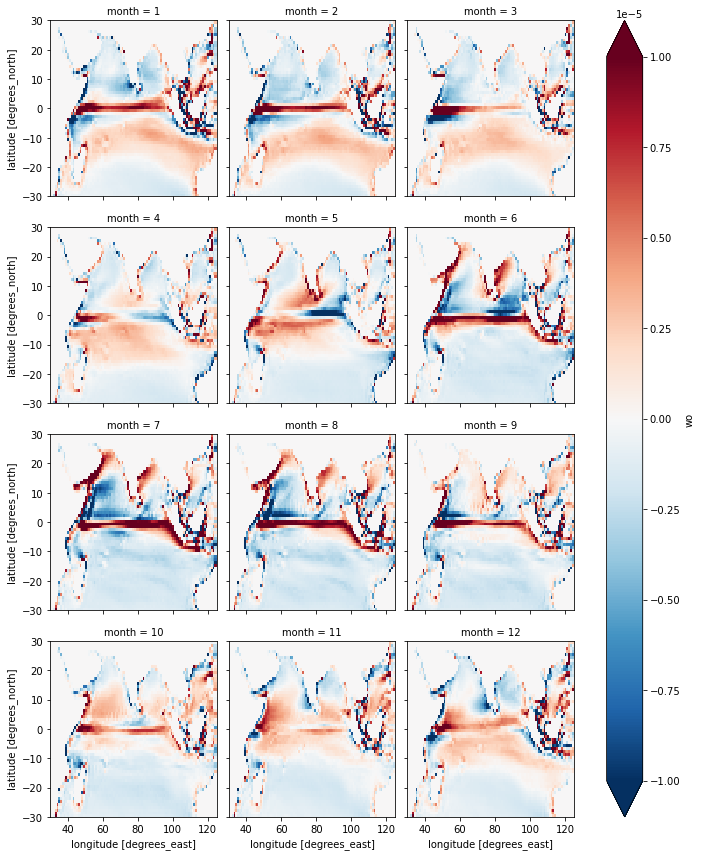

In [57]:
wmm.plot(col='month', col_wrap = 3,vmin = -1e-5)

In [22]:
#fucntion to create regional plots for multimodel mean of each variable
def plot_region_cur_dt(MM_D, OB_D, lat, lat_r, lon, lon_r):
    #create a 'model-series' for each variable
    for i, model in enumerate(MM_D.keys()):
        HB = MM_D[model]
        tx=HB['dtdx']
        ty=HB['dtdy']
        tz=HB['dtdz']
        u=HB['ucur']
        v=HB['vcur']
        w=HB['wcur']
        #now turn all these variables into an array
        if i == 0:
            txm = tx
            tym = ty
            tzm = tz
            um = u
            vm = v
            wm = w
        else:
            txm = xr.concat([txm, tx], dim = 'model')
            tym = xr.concat([tym, ty], dim = 'model')
            tzm = xr.concat([tzm, tz], dim = 'model')
            um = xr.concat([um, u], dim = 'model')
            vm = xr.concat([vm, v], dim = 'model')
            wm = xr.concat([wm, w], dim = 'model')

    #Now calculate the multimodel means/
    txmm = txm.median(dim = 'model')
    tymm = tym.median(dim = 'model')
    tzmm = tzm.median(dim = 'model')
    umm = um.median(dim = 'model')
    vmm = vm.median(dim = 'model')
    wmm = wm.median(dim = 'model')

    #get the spatial average of these
    #TM = get_region(TM, lat, lat_r, lon, lon_r)
    #NOW LETS PLOT
    fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(30, 8), sharex='all')
    fig.set_facecolor('white')

    axes[0].plot(range(1,13), get_region((txmm), lat, lat_r, lon, lon_r), label = 'dtdx')
    axes[2].plot(range(1,13), get_region((tymm), lat, lat_r, lon, lon_r), label = 'dtdy')
    axes[4].plot(range(1,13), get_region((tzmm), lat, lat_r, lon, lon_r), label = 'dtdz')
    axes[1].plot(range(1,13), get_region((umm), lat, lat_r, lon, lon_r), label = 'u')
    axes[3].plot(range(1,13), get_region((vmm), lat, lat_r, lon, lon_r), label = 'v')
    axes[5].plot(range(1,13), get_region((wmm), lat, lat_r, lon, lon_r), label = 'CMIP6')
    #plot rean
    for ob in OB_D.keys():
        #get_region(obs[ob]['tx'], lat, lat1, lon, lon1).plot(label = ob)
        axes[0].plot(range(1,13), get_region((OB_D[ob]['dtdx']), lat, lat_r, lon, lon_r), label = ob)
        axes[2].plot(range(1,13), get_region((OB_D[ob]['dtdy']), lat, lat_r, lon, lon_r), label = ob)
        axes[4].plot(range(1,13), get_region((OB_D[ob]['dtdz']), lat, lat_r, lon, lon_r), label = ob)
        axes[1].plot(range(1,13), get_region((OB_D[ob]['ucur']), lat, lat_r, lon, lon_r), label = ob)
        axes[3].plot(range(1,13), get_region((OB_D[ob]['vcur']), lat, lat_r, lon, lon_r), label = ob)
        axes[5].plot(range(1,13), get_region((OB_D[ob]['wcur']), lat, lat_r, lon, lon_r), label = ob)
    axes[5].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[0].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[1].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[2].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[3].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[4].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[5].axhline(0, c='k', ls = '--', lw = 0.5)

    #now plot ranges
    axes[0].fill_between(range(1,13), get_region(((txm.quantile(0.25, 'model'))), lat, lat_r, lon, lon_r),
                      get_region(((txm.quantile(0.75, 'model'))), lat, lat_r, lon, lon_r), 
                      alpha = 0.25)
    axes[2].fill_between(range(1,13), get_region(((tym.quantile(0.25, 'model'))), lat, lat_r, lon, lon_r),
                      get_region(((tym.quantile(0.75, 'model'))), lat, lat_r, lon, lon_r), 
                      alpha = 0.25)
    axes[4].fill_between(range(1,13), get_region(((tzm.quantile(0.25, 'model'))), lat, lat_r, lon, lon_r),
                      get_region(((tzm.quantile(0.75, 'model'))), lat, lat_r, lon, lon_r), 
                      alpha = 0.25)
    axes[1].fill_between(range(1,13), get_region(((um.quantile(0.25, 'model'))), lat, lat_r, lon, lon_r),
                      get_region(((um.quantile(0.75, 'model'))), lat, lat_r, lon, lon_r), 
                      alpha = 0.25)
    axes[3].fill_between(range(1,13), get_region(((vm.quantile(0.25, 'model'))), lat, lat_r, lon, lon_r),
                      get_region(((vm.quantile(0.75, 'model'))), lat, lat_r, lon, lon_r), 
                      alpha = 0.25)
    axes[5].fill_between(range(1,13), get_region(((wm.quantile(0.25, 'model'))), lat, lat_r, lon, lon_r),
                      get_region(((wm.quantile(0.75, 'model'))), lat, lat_r, lon, lon_r), 
                      alpha = 0.25)
    axes[0].set_title('$dT/dx$')
    axes[2].set_title('$dT/dy$')
    axes[4].set_title('$dT/dz$')
    axes[1].set_title('U')
    axes[3].set_title('V')
    axes[5].set_title('W')
    return fig

/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/na

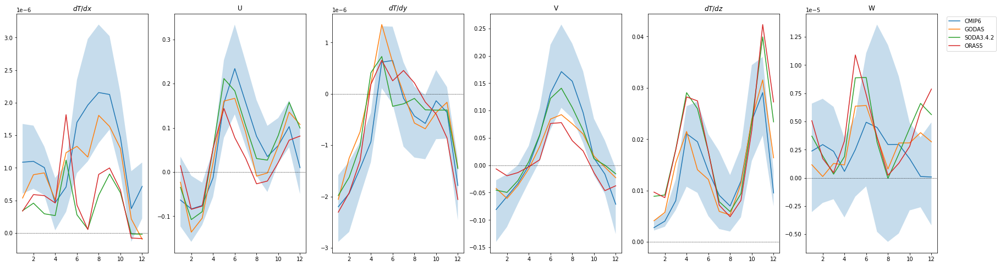

In [24]:
a = plot_region_cur_dt(models2, OBS2, -3, 3,40, 50)#wtio equator - see if supressed upelling at eautor

/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/na

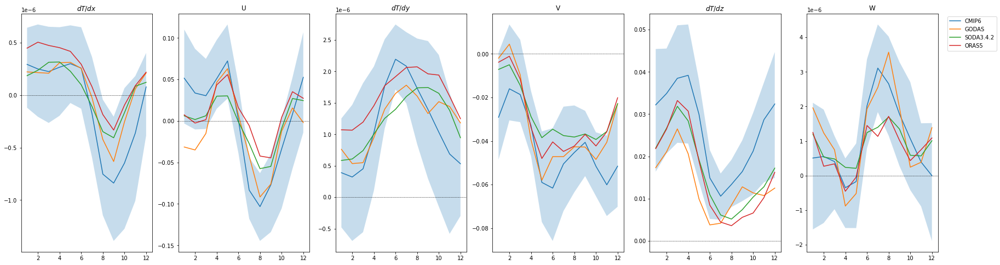

In [27]:
a = plot_region_cur_dt(models2, OBS2, -10, 0, 90,110)

/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/na

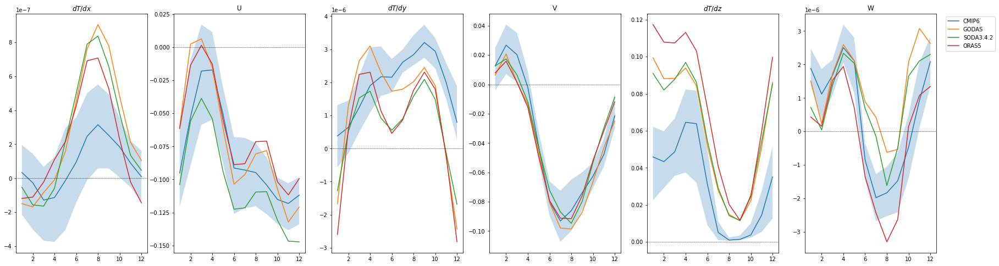

In [30]:
a = plot_region_cur_dt(models2, OBS2, -10, -7, 50,70)

/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/na

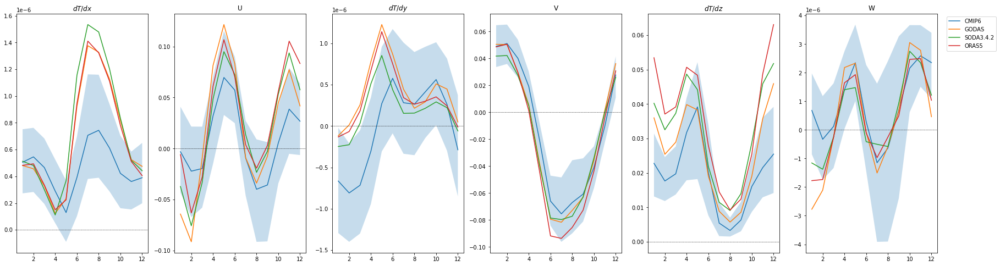

In [28]:
a = plot_region_cur_dt(models2, OBS2, -10, 10, 50,70)

/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/na

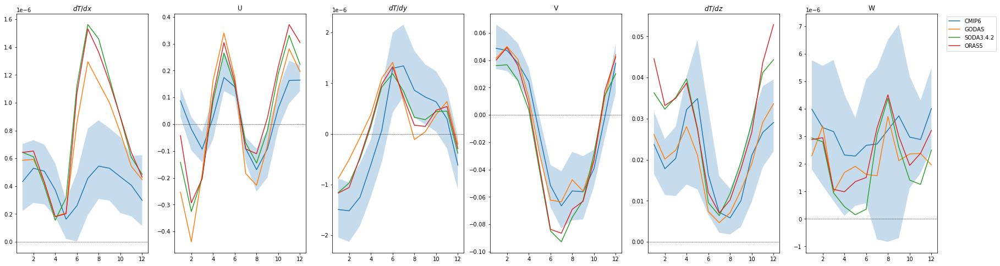

In [29]:
a = plot_region_cur_dt(models2, OBS2, -3, 3, 50,70)

/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/na

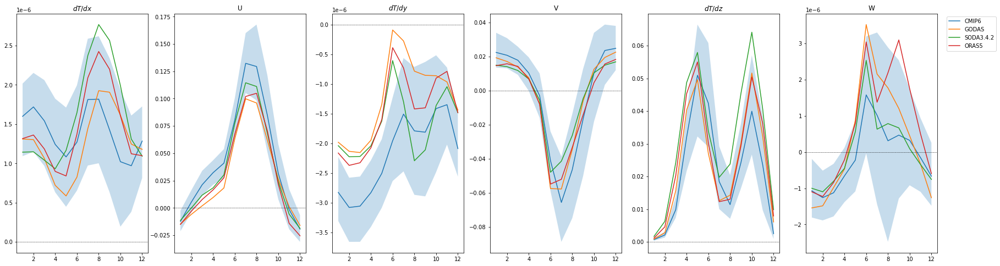

In [40]:
a = plot_region_cur_dt(models2, OBS2,10, 20, 50,70)#Arab sea

In [35]:
#load in GODAS data
gdx = xr.open_dataarray('/home/z5113258/Documents/GODAS/remapcon_1/climatology/GODAS_dtdx.nc').sel(lat=slice(-40,30),lon=slice(30,125))
gdy = xr.open_dataarray('/home/z5113258/Documents/GODAS/remapcon_1/climatology/GODAS_dtdy.nc').sel(lat=slice(-40,30),lon=slice(30,125))
gdz = xr.open_dataarray('/home/z5113258/Documents/GODAS/remapcon_1/climatology/GODAS_dtdz.nc').sel(lat=slice(-40,30),lon=slice(30,125))
guc = xr.open_dataarray('/home/z5113258/Documents/GODAS/remapcon_1/climatology/GODAS_ucur.nc').sel(lat=slice(-40,30),lon=slice(30,125))
gvc = xr.open_dataarray('/home/z5113258/Documents/GODAS/remapcon_1/climatology/GODAS_vcur.nc').sel(lat=slice(-40,30),lon=slice(30,125))
gwc = xr.open_dataarray('/home/z5113258/Documents/GODAS/remapcon_1/climatology/GODAS_wcur.nc').sel(lat=slice(-40,30),lon=slice(30,125))


In [19]:
#look at dtdx*U and check if cycle is the same
#fucntion to create regional plots for multimodel mean of each variable
def plot_region_cur_dt(MM_D, lat, lat_r, lon, lon_r):
    #create a 'model-series' for each variable
    for i, model in enumerate(MM_D.keys()):
        HB = MM_D[model]
        tx=HB['dtdx']
        ty=HB['dtdy']
        tz=HB['dtdz']
        u=HB['ucur']
        v=HB['vcur']
        w=HB['wcur']
        #now turn all these variables into an array
        if i == 0:
            txm = tx
            tym = ty
            tzm = tz
            um = u
            vm = v
            wm = w
        else:
            txm = xr.concat([txm, tx], dim = 'model')
            tym = xr.concat([tym, ty], dim = 'model')
            tzm = xr.concat([tzm, tz], dim = 'model')
            um = xr.concat([um, u], dim = 'model')
            vm = xr.concat([vm, v], dim = 'model')
            wm = xr.concat([wm, w], dim = 'model')

    #Now calculate the multimodel means/
    txmm = txm.median(dim = 'model')
    tymm = tym.median(dim = 'model')
    tzmm = tzm.median(dim = 'model')
    umm = um.median(dim = 'model')
    vmm = vm.median(dim = 'model')
    wmm = wm.median(dim = 'model')

    #get the spatial average of these
    #TM = get_region(TM, lat, lat_r, lon, lon_r)
    #NOW LETS PLOT
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 4), sharex='all')
    fig.set_facecolor('white')

    axes[0].plot(range(1,13), get_region((txmm*-umm), lat, lat_r, lon, lon_r), label = 'dtdx')
    axes[1].plot(range(1,13), get_region((txmm), lat, lat_r, lon, lon_r), label = 'dtdy')
    axes[2].plot(range(1,13), get_region((umm), lat, lat_r, lon, lon_r), label = 'dtdz')
  
    #axes[0].plot(range(1,13), get_region((gdx*-guc), lat, lat_r, lon, lon_r), label = 'dtdx')
    #axes[1].plot(range(1,13), get_region((gdx), lat, lat_r, lon, lon_r), label = 'dtdy')
    #axes[2].plot(range(1,13), get_region((guc), lat, lat_r, lon, lon_r), label = 'dtdz')

    #axes[5].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[0].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[1].axhline(0, c='k', ls = '--', lw = 0.5)
    axes[2].axhline(0, c='k', ls = '--', lw = 0.5)
    

    return fig

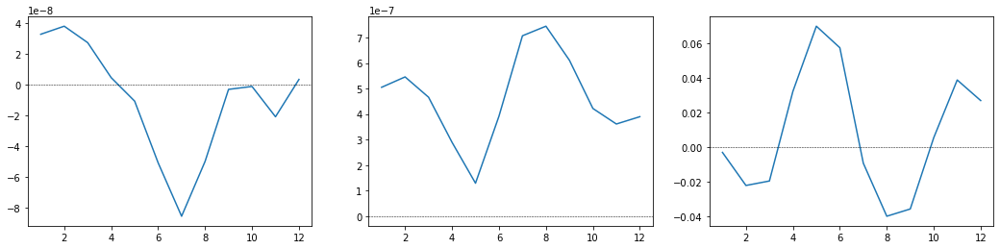

In [20]:
a = plot_region_cur_dt(models2, -10, 10, 50,70)

In [16]:
def plotMonthly_corr_dt(MDIC, lat, lat_r, lon, lon_r):
    for i, model in enumerate(MDIC.keys()):
        HB = MDIC[model]
        T=HB['dTdt']
        U=HB['ua']
        V=HB['va']
        W=HB['wa']
        Q=HB['q']
        resid = HB['res']
        T = T.assign_coords({"model":model})
        U = U.assign_coords({"model":model})
        V = V.assign_coords({"model":model})
        W = W.assign_coords({"model":model})
        Q = Q.assign_coords({"model":model})
        resid = resid.assign_coords({"model":model})
        #now turn all these variables into an array
        if i == 0:
            TM = T
            UM = U
            VM = V
            WM = W
            QM = Q
            RM = resid
        else:
            TM = xr.concat([TM, T], dim = 'model')
            UM = xr.concat([UM, U], dim = 'model')
            VM = xr.concat([VM, V], dim = 'model')
            WM = xr.concat([WM, W], dim = 'model')
            QM = xr.concat([QM, Q], dim = 'model')
            RM = xr.concat([RM, resid], dim = 'model')    
    DS = xr.Dataset(data_vars=dict(
            TM=(["model", "month", "lat", "lon"], TM),
            UM=(["model", "month", "lat", "lon"], UM),
            VM=(["model", "month", "lat", "lon"], VM),
            WM=(["model", "month", "lat", "lon"], WM),
            QM=(["model", "month", "lat", "lon"], QM),
            RM=(["model", "month", "lat", "lon"], RM)),
        coords=dict(
            month=(TM.month),
            model=(TM.model),
            lat = (TM.lat), lon = (TM.lon)),
        attrs=dict(description="Dataset of all heat budget varibales to correlate/scatter plot with"))
    reg =  get_region((DS*(3986*1026*50)), lat, lat_r, lon, lon_r)
    ru = xs.pearson_r(reg['TM'], reg['UM'], dim = 'model').assign_coords({"var":1})
    rv = xs.pearson_r(reg['TM'], reg['VM'], dim = 'model').assign_coords({"var":2})
    rw = xs.pearson_r(reg['TM'], reg['WM'], dim = 'model').assign_coords({"var":3})
    rq = xs.pearson_r(reg['TM'], reg['QM'], dim = 'model').assign_coords({"var":4})
    rr = xs.pearson_r(reg['TM'], reg['RM'], dim = 'model').assign_coords({"var":5})
    pu = xs.pearson_r_p_value(reg['TM'], reg['UM'], dim = 'model').assign_coords({"var":1})
    pv = xs.pearson_r_p_value(reg['TM'], reg['VM'], dim = 'model').assign_coords({"var":2})
    pw = xs.pearson_r_p_value(reg['TM'], reg['WM'], dim = 'model').assign_coords({"var":3})
    pq = xs.pearson_r_p_value(reg['TM'], reg['QM'], dim = 'model').assign_coords({"var":4})
    pr = xs.pearson_r_p_value(reg['TM'], reg['RM'], dim = 'model').assign_coords({"var":5})

    DA1 = xr.concat([ru, rv, rw, rq, rr], dim = "var")
    DA2 = xr.concat([pu, pv, pw, pq, pr], dim = "var")
    DA3 = DA1.where(DA2<=0.05, np.nan)
    #now plot figures
    DA2.where(DA2<=0.05, -1).plot.imshow(cmap = 'Greys_r',add_colorbar = False)#plot black wher eno significant
    DA3.plot.imshow()#plto colors where significant
    plt.yticks([1,2,3,4,5],['$dT/dt$:$Advection_{u}$','$dT/dt$:$Advection_{v}$',
                            '$dT/dt$:$Advection_{w}$','$dT/dt$:$Qnet$','$dT/dt$:$resid$',])#plot variables corerlated
    plt.ylabel(' ')
    plt.title(f"Intermodel Pearson correlation, p<0.05 \n {lon} - {lon_r}E, {lat}-{lat_r}N")
    return

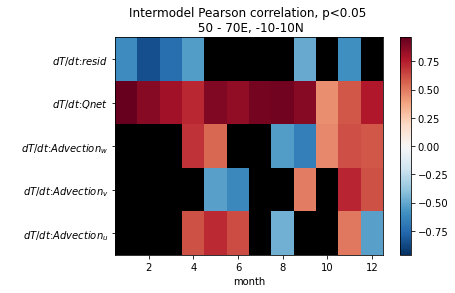

In [17]:
a = plotMonthly_corr_dt(models1, -10, 10, 50, 70)

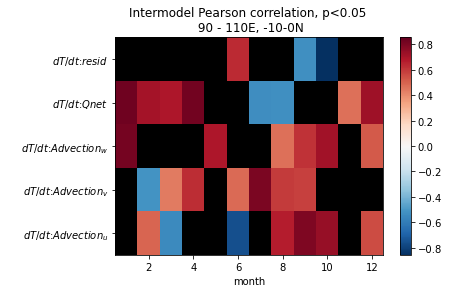

In [19]:
a = plotMonthly_corr_dt(models1, -10, 0, 90, 110)

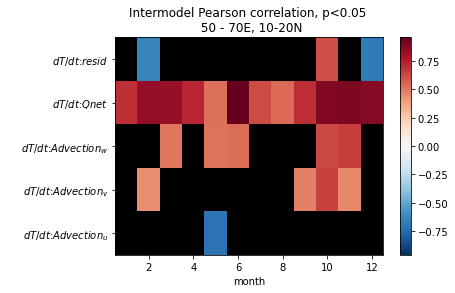

In [20]:
a = plotMonthly_corr_dt(models1, 10, 20, 50,70)

In [18]:
def scatter_corr_MM(MM_D, v1, v2, lat, lat_r, lon, lon_r):
    #create a 'model-series' for each variable
    for i, model in enumerate(MM_D.keys()):
        HB = MM_D[model]
        T=HB[v1]
        U=HB[v2]
        
        
        #get area avaerage of these
        T = get_region((T*(3986*1026*50)), lat, lat_r, lon, lon_r)
        U = get_region((U*(3986*1026*50)), lat, lat_r, lon, lon_r)
        T = T.assign_coords({"model":model})
        U = U.assign_coords({"model":model})
        
        #now turn all these variables into an array
        if i == 0:
            TM = T
            UM = U
            
        else:
            TM = xr.concat([TM, T], dim = 'model')
            UM = xr.concat([UM, U], dim = 'model')
    #convert to datset to make a scatetr plot of vars
    DS = xr.Dataset(data_vars=dict(
            TM=(["model", "month"], TM),
            UM=(["model", "month"], UM),),
        coords=dict(
            month=(TM.month),
            model=(TM.model),),
        attrs=dict(description="Dataset of 2 varibales to correlate/scatter plot with"))
    #r = xs.pearson_r(DS['T1'], DS['U1'], dim = 'model')
    #pv = xs.pearson_r_eff_p_value(DS['T1'], DS['U1'], dim = 'model')
    #now we can make a scatter plot of the strenght of the terms for each month
    #make size array for 20 models
    size = [1,1,1,1,1,1,1,1,1,1,2,2,2,2,2,2,2,2,2,2,]
    #DS = DS.assign_coords({'sz':size})
    p = DS.plot.scatter(x='TM', y='UM', col = 'month', col_wrap = 3, 
                hue =  'model', hue_style="discrete")
    #calculate correlation coefficient
    
    for i, ax in enumerate(p.axes.flat):
        if i in [0,3,6,9]:
            ax.set_ylabel(v2)
        if i in [9,10,11]:
            ax.set_xlabel(v1)
        #ax.set_title((str('r = '), r.values[i]))
    return p

In [19]:
def get_model_DS(MODS, lat, lat_r, lon, lon_r):
    for i, model in enumerate(MODS.keys()):
        HB = MODS[model]
        T= get_region((HB['dTdt']*(3986*1026*50)), lat, lat_r, lon, lon_r)
        U=get_region((HB['ua']*(3986*1026*50)), lat, lat_r, lon, lon_r)
        V=get_region((HB['va']*(3986*1026*50)), lat, lat_r, lon, lon_r)
        W=get_region((HB['wa']*(3986*1026*50)), lat, lat_r, lon, lon_r)
        Q=get_region((HB['q']*(3986*1026*50)), lat, lat_r, lon, lon_r)
        resid = get_region((HB['res']*(3986*1026*50)), lat, lat_r, lon, lon_r)
        SST = get_region((HB['SST']), lat, lat_r, lon, lon_r)

        T = T.assign_coords({"model":model})
        U = U.assign_coords({"model":model})
        V = V.assign_coords({"model":model})
        W = W.assign_coords({"model":model})
        Q = Q.assign_coords({"model":model})
        resid = resid.assign_coords({"model":model})
        SST = SST.assign_coords({"model":model})
        SST = SST-get_region(OSST, lat, lat_r, lon, lon_r)
        #now turn all these variables into an array
        if i == 0:
            TM = T
            UM = U
            VM = V
            WM = W
            QM = Q
            RM = resid
            SSTM = SST
        else:
            TM = xr.concat([TM, T], dim = 'model')
            UM = xr.concat([UM, U], dim = 'model')
            VM = xr.concat([VM, V], dim = 'model')
            WM = xr.concat([WM, W], dim = 'model')
            QM = xr.concat([QM, Q], dim = 'model')
            RM = xr.concat([RM, resid], dim = 'model')    
            SSTM = xr.concat([SSTM, SST], dim = 'model')    
    DS = xr.Dataset(data_vars=dict(
            TM=(["model", "month"], TM),
            UM=(["model", "month"], UM),
            VM=(["model", "month"], VM),
            WM=(["model", "month"], WM),
            QM=(["model", "month"], QM),
            SSTM=(["model", "month"], SSTM),
            RM=(["model", "month"], RM)),
        coords=dict(
            month=(TM.month),
            model=(TM.model)),
            #lat = (TM.lat), lon = (TM.lon)),
        attrs=dict(description="Dataset of all heat budget varibales to correlate/scatter plot with"))
    return DS

In [20]:
DS_WTIO = get_model_DS(models1, -10, 10, 50, 70)
DS_SETIO = get_model_DS(models1, -10, 0, 90, 110)
DS_ARAB = get_model_DS(models1, 10, 20, 50,70)
#DS_sctr = get_model_DS(models1, -10, -7, 50,70)
#DS_NWA = get_model_DS(models1, -25, -15, 100,110)
#DS_weq  = get_model_DS(models1, -2, 2, 50, 70)
#DS_EQ  = get_model_DS(models1, -3, 3, 50,70)


/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [24]:
#look at meridonal wind and w advection in SETIO region
#load in tauu
datadir = '/home/z5113258/Documents/data/CMIP6_HB_new/'
#dict with file names
varis = {'tx':'_tauu.nc', 'ty':'_tauv.nc'}
models2={}
#get all data for temp tendency
for model in os.listdir(datadir):
    #go thorugh all varis
    if model in ['NESM3']:
        pass
    else:
        mod={}
        for key in varis.keys():
            #input file
            inp_files = (os.path.join(datadir, model, str(model+varis[key])))
            try:
                #load in file
                var = xr.open_dataarray(inp_files)
                #put into dict
                mod[key]=var
            except Exception as e:
                print(e)
                pass
        #now append data to model dict
        models2[model] = mod


[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_tauu.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB_new/not_full/not_full_tauv.nc'


In [45]:
def get_model_DS(MODS1, MODS2, lat, lat_r, lon, lon_r):
    for i, model in enumerate(MODS1.keys()):
        HB = MODS1[model]
        TAU = MODS2[model]
        U=get_region((HB['wa']), lat, lat_r, lon, lon_r)
        TAUU=get_region(TAU['ty'], lat, lat_r, lon, lon_r)
        U = U.assign_coords({"model":model})
        TAUU = TAUU.assign_coords({"model":model})

        if i == 0:
            UM = U
            TUM=TAUU
        else:
            UM = xr.concat([UM, U], dim = 'model')
            TUM = xr.concat([TUM, TAUU], dim = 'model')
            
    DS = xr.Dataset(data_vars=dict(
            UM=(["model", "month"], UM),
            TUM=(["model", "month"], TUM)),
        coords=dict(
            month=(UM.month),
            model=(UM.model)),
        attrs=dict(description="Dataset of all heat budget varibales to correlate/scatter plot with"))
    return DS

In [46]:
DSU = get_model_DS(models1, models2, -10,0,90,110)

In [47]:
import xskillscore as xs

C = xs.pearson_r(DSU['UM'], DSU['TUM'], dim = 'model')
P = xs.pearson_r_p_value(DSU['UM'], DSU['TUM'], dim = 'model')
tu = regress(DSU['TUM'], DSU['UM']).assign_coords({"var":1})
tv = regress(DSU['UM'], DSU['TUM']).assign_coords({"var":2})

Text(0.5, 1.0, 'Meridonal wind stress on vertical advection SETIO')

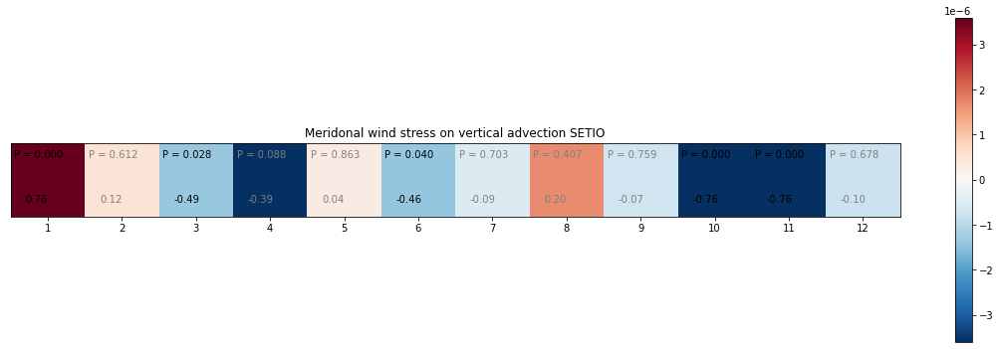

In [48]:
plt.figure(figsize=(20,6))
plt.imshow([tu.values], 'RdBu_r', vmin = -1*tu.values.max(), vmax = tu.values.max())
plt.colorbar()
for i in range(0,12):
    plt.text(i-0.3,0.3,f'{C.sel(month = i+1).values:.2f}', 
                     color = 'k' if P.sel(month = i+1).values < 0.05 else 'gray')
    plt.text(i-0.45,-0.3,f'P = {P.sel(month = i+1).values:.3f}', 
                     color = 'k' if P.sel(month = i+1).values < 0.05 else 'gray')
plt.xticks(range(0,12), range(1,13))   
plt.yticks([])
plt.title('Meridonal wind stress on vertical advection SETIO')

In [21]:
def linear_trend(x, y):
    pf = np.polyfit(x, y, 1)
    return xr.DataArray(pf[0])

In [22]:
def regress(var1, var2):
    slope = xr.apply_ufunc(linear_trend,
                        var1, var2,
                        vectorize=True,
                        dask = 'parallelized',
                        input_core_dims=[['model'], ['model']],# reduce along 'model'
                        )
    return slope

In [23]:
def plot_regress_DT(DS):
    tu = regress(DS['UM'], DS['TM']).assign_coords({"var":1})
    tv = regress(DS['VM'], DS['TM']).assign_coords({"var":2})
    tw = regress(DS['WM'], DS['TM']).assign_coords({"var":3})
    tq = regress(DS['QM'], DS['TM']).assign_coords({"var":4})
    tr = regress(DS['RM'], DS['TM']).assign_coords({"var":5})

    DA1 = xr.concat([tu, tv, tw, tq, tr], dim = "var")
    DA1.plot.imshow()#plto colors where significant
    plt.yticks([1,2,3,4,5],['$dT/dt$:$Advection_{u}$','$dT/dt$:$Advection_{v}$',
                            '$dT/dt$:$Advection_{w}$','$dT/dt$:$Qnet$','$dT/dt$:$resid$',])#plot variables corerlated
    plt.ylabel(' ')
    plt.title("Intermodel regression coeficient by month ")
    return

In [30]:
def plot_regress_sst(DS):
    tu = regress(DS['UM'], DS['SSTM']).assign_coords({"var":1})
    tv = regress(DS['VM'], DS['SSTM']).assign_coords({"var":2})
    tw = regress(DS['WM'], DS['SSTM']).assign_coords({"var":3})
    tq = regress(DS['QM'], DS['SSTM']).assign_coords({"var":4})
    tr = regress(DS['RM'], DS['SSTM']).assign_coords({"var":5})
    tt = regress(DS['TM'], DS['SSTM']).assign_coords({"var":6})

    DA1 = xr.concat([tu, tv, tw, tq, tr, tt], dim = "var")
    DA1.plot.imshow()#plto colors where significant
    plt.yticks([1,2,3,4,5,6],['$Advection_{u}$: $SST bias$','$Advection_{v}$: $SST bias$',
                            '$Advection_{w}$: $SST bias$','$Qnet$: $SST bias$','$resid$: $SST bias$','$dT/dt$: $SST bias$'])#plot variables corerlated
    plt.ylabel(' ')
    plt.title("Intermodel regression coeficient by month ")
    return

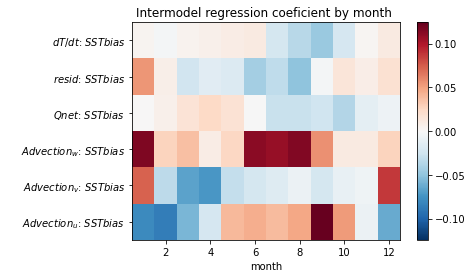

In [24]:
plot_regress_sst(DS_WTIO)

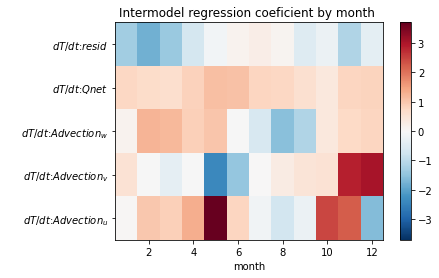

In [25]:
plot_regress_DT(DS_WTIO)

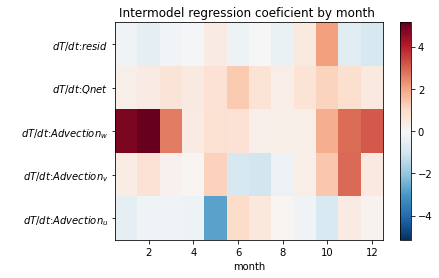

In [26]:
plot_regress_DT(DS_ARAB)

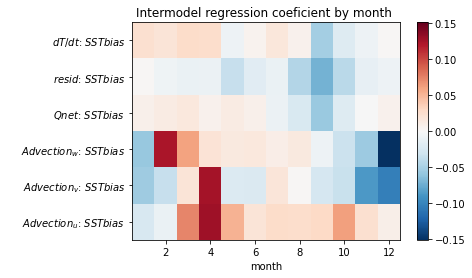

In [27]:
plot_regress_sst(DS_ARAB)

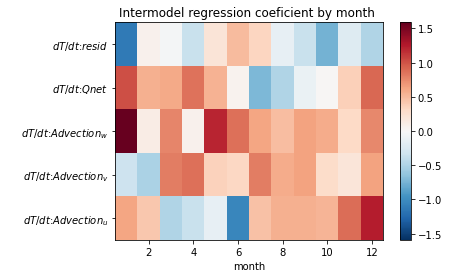

In [28]:
plot_regress_DT(DS_SETIO)

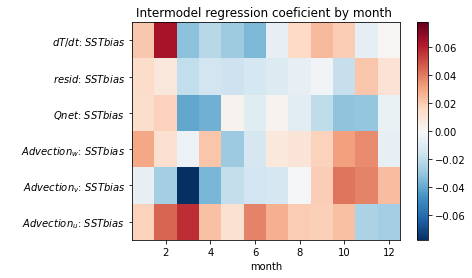

In [29]:
plot_regress_sst(DS_SETIO)

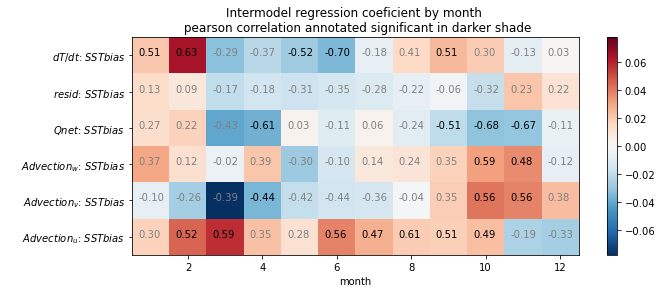

In [31]:
plot_regress_sst_lag(DS_SETIO)

In [21]:
def plot_regress_sst_lag(DS):
    #lag SST
    SST_lag = DS['SSTM']#.roll(month=1).assign_coords(month=DS['SSTM'].month)    
    tu = regress(DS['UM'], SST_lag).assign_coords({"var":1})
    tv = regress(DS['VM'], SST_lag).assign_coords({"var":2})
    tw = regress(DS['WM'], SST_lag).assign_coords({"var":3})
    tq = regress(DS['QM'], SST_lag).assign_coords({"var":4})
    tr = regress(DS['RM'], SST_lag).assign_coords({"var":5})
    tt = regress(DS['TM'], SST_lag).assign_coords({"var":6})
    
    ru = xs.pearson_r(DS['UM'], SST_lag, dim = 'model').assign_coords({"var":1})
    rv = xs.pearson_r(DS['VM'], SST_lag, dim = 'model').assign_coords({"var":2})
    rw = xs.pearson_r(DS['WM'], SST_lag, dim = 'model').assign_coords({"var":3})
    rq = xs.pearson_r(DS['QM'], SST_lag, dim = 'model').assign_coords({"var":4})
    rr = xs.pearson_r(DS['RM'], SST_lag, dim = 'model').assign_coords({"var":5})
    rt = xs.pearson_r(DS['TM'], SST_lag, dim = 'model').assign_coords({"var":6})
    pu = xs.pearson_r_p_value(DS['UM'], SST_lag, dim = 'model').assign_coords({"var":1})
    pv = xs.pearson_r_p_value(DS['VM'], SST_lag, dim = 'model').assign_coords({"var":2})
    pw = xs.pearson_r_p_value(DS['WM'], SST_lag, dim = 'model').assign_coords({"var":3})
    pq = xs.pearson_r_p_value(DS['QM'], SST_lag, dim = 'model').assign_coords({"var":4})
    pr = xs.pearson_r_p_value(DS['RM'], SST_lag, dim = 'model').assign_coords({"var":5})
    pt = xs.pearson_r_p_value(DS['TM'], SST_lag, dim = 'model').assign_coords({"var":6})

    
    
    DA1 = xr.concat([tu, tv, tw, tq, tr, tt], dim = "var")
    DA2 = xr.concat([ru, rv, rw, rq, rr, rt], dim = "var")
    DA3 = xr.concat([pu, pv, pw, pq, pr, pt], dim = "var")
    plt.figure(figsize=(10,4))
    DA1.plot.imshow()#plto colors where significant
    plt.yticks([1,2,3,4,5,6],['$Advection_{u}$: $SST bias$','$Advection_{v}$: $SST bias$',
                            '$Advection_{w}$: $SST bias$','$Qnet$: $SST bias$','$resid$: $SST bias$','$dT/dt$: $SST bias$'])#plot variables corerlated
    plt.ylabel(' ')
    plt.title("Intermodel regression coeficient by month \n pearson correlation annotated significant in darker shade")
    for i in range(0,12):
        for j in range(1,7):
            plt.text(i+0.66,j,f'{DA2.sel(month = i+1).sel(var = j).values:.2f}', 
                     color = 'k' if DA3.sel(month = i+1).sel(var = j).values < 0.05 else 'gray')
                  
    return

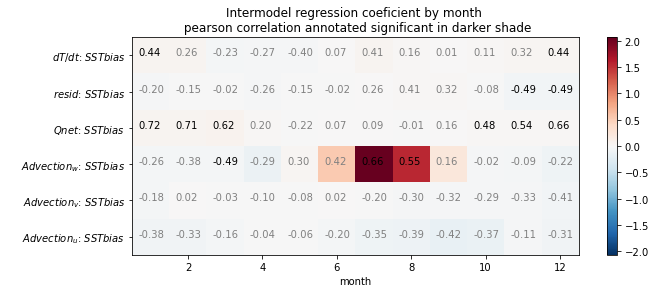

In [44]:
plot_regress_sst_lag(DS_NWA)

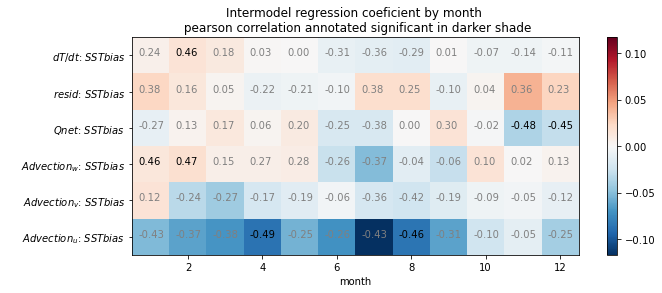

In [26]:
plot_regress_sst_lag(DS_sctr)

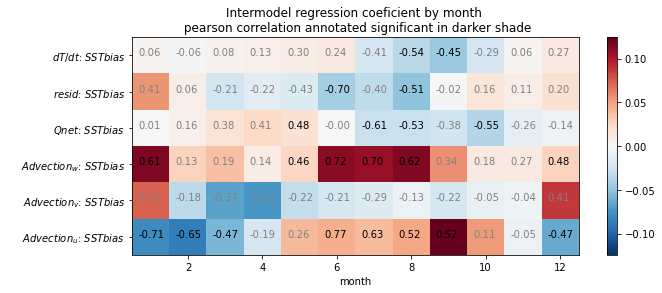

In [28]:
plot_regress_sst_lag(DS_WTIO)

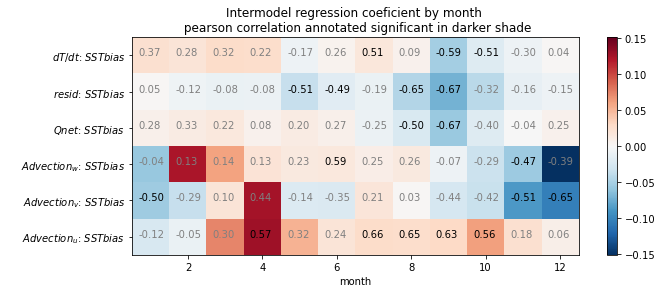

In [29]:
plot_regress_sst_lag(DS_ARAB)

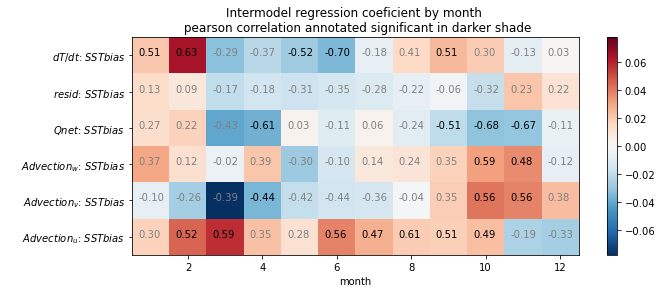

In [30]:
plot_regress_sst_lag(DS_SETIO)

In [31]:
def plot_regress_corr_dt(DS):
    #lag SST
    SST_lag = DS['TM']#.roll(month=1).assign_coords(month=DS['SSTM'].month)    
    tu = regress(DS['UM'], SST_lag).assign_coords({"var":1})
    tv = regress(DS['VM'], SST_lag).assign_coords({"var":2})
    tw = regress(DS['WM'], SST_lag).assign_coords({"var":3})
    tq = regress(DS['QM'], SST_lag).assign_coords({"var":4})
    tr = regress(DS['RM'], SST_lag).assign_coords({"var":5})
    tt = regress(DS['TM'], SST_lag).assign_coords({"var":6})
    
    ru = xs.pearson_r(DS['UM'], SST_lag, dim = 'model').assign_coords({"var":1})
    rv = xs.pearson_r(DS['VM'], SST_lag, dim = 'model').assign_coords({"var":2})
    rw = xs.pearson_r(DS['WM'], SST_lag, dim = 'model').assign_coords({"var":3})
    rq = xs.pearson_r(DS['QM'], SST_lag, dim = 'model').assign_coords({"var":4})
    rr = xs.pearson_r(DS['RM'], SST_lag, dim = 'model').assign_coords({"var":5})
    rt = xs.pearson_r(DS['TM'], SST_lag, dim = 'model').assign_coords({"var":6})
    pu = xs.pearson_r_p_value(DS['UM'], SST_lag, dim = 'model').assign_coords({"var":1})
    pv = xs.pearson_r_p_value(DS['VM'], SST_lag, dim = 'model').assign_coords({"var":2})
    pw = xs.pearson_r_p_value(DS['WM'], SST_lag, dim = 'model').assign_coords({"var":3})
    pq = xs.pearson_r_p_value(DS['QM'], SST_lag, dim = 'model').assign_coords({"var":4})
    pr = xs.pearson_r_p_value(DS['RM'], SST_lag, dim = 'model').assign_coords({"var":5})
    pt = xs.pearson_r_p_value(DS['TM'], SST_lag, dim = 'model').assign_coords({"var":6})

    
    
    DA1 = xr.concat([tu, tv, tw, tq, tr], dim = "var")
    DA2 = xr.concat([ru, rv, rw, rq, rr], dim = "var")
    DA3 = xr.concat([pu, pv, pw, pq, pr], dim = "var")
    plt.figure(figsize=(10,4))
    DA1.plot.imshow()#plto colors where significant
    plt.yticks([1,2,3,4,5],['$Advection_{u}$: $dT/dt$','$Advection_{v}$: $dT/dt$',
                            '$Advection_{w}$: $dT/dt$','$Qnet$: $dT/dt$','$resid$: $dT/dt$',])#plot variables corerlated
    plt.ylabel(' ')
    plt.title("Intermodel regression coeficient by month \n pearson correlation annotated significant in darker shade")
    for i in range(0,12):
        for j in range(1,6):
            plt.text(i+0.66,j,f'{DA2.sel(month = i+1).sel(var = j).values:.2f}', 
                     color = 'k' if DA3.sel(month = i+1).sel(var = j).values < 0.05 else 'gray')
                  
    return

/home/z5113258/anaconda3/lib/python3.8/site-packages/xskillscore/core/np_deterministic.py:281: RuntimeWarning: divide by zero encountered in true_divide
  t_squared = r ** 2 * (dof / ((1.0 - r) * (1.0 + r)))


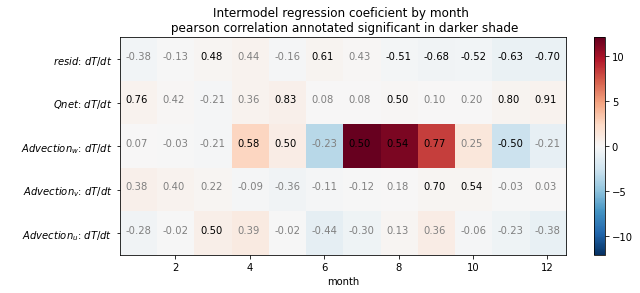

In [45]:
plot_regress_corr_dt(DS_NWA)

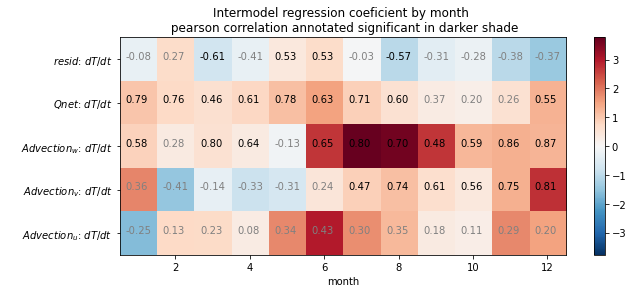

In [30]:
plot_regress_corr_dt(DS_sctr)

/home/z5113258/anaconda3/lib/python3.8/site-packages/xskillscore/core/np_deterministic.py:281: RuntimeWarning: divide by zero encountered in true_divide
  t_squared = r ** 2 * (dof / ((1.0 - r) * (1.0 + r)))


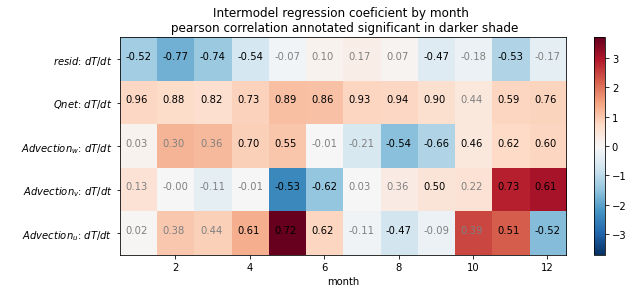

In [29]:
plot_regress_corr_dt(DS_WTIO)

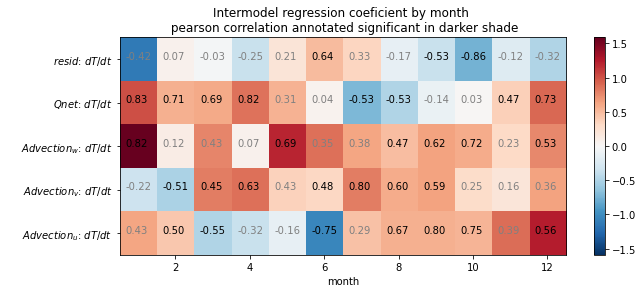

In [33]:
plot_regress_corr_dt(DS_SETIO)

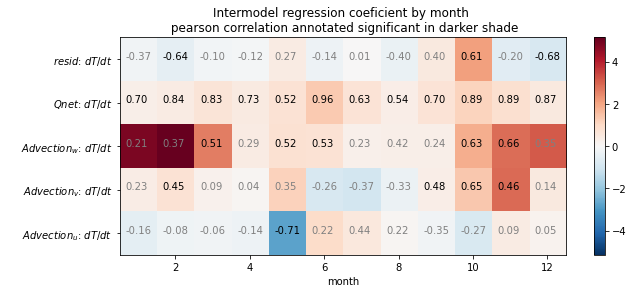

In [34]:
plot_regress_corr_dt(DS_ARAB)

/home/z5113258/anaconda3/lib/python3.8/site-packages/xskillscore/core/np_deterministic.py:281: RuntimeWarning: divide by zero encountered in true_divide
  t_squared = r ** 2 * (dof / ((1.0 - r) * (1.0 + r)))


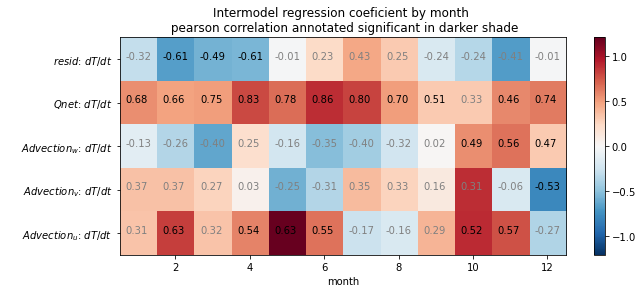

In [32]:
plot_regress_corr_dt(DS_EQ)

In [35]:
#load in wind speed, tc depth and wsc values for CMIP6. we want to make more corr/regression matrices.
#

In [35]:
datadir = '/home/z5113258/Documents/data/CMIP6_HB/'
#dict with file names
varis = {'Wspd':'_wspd.nc', 'WSC':'_wsc.nc', 'z20':'_z20.nc'}
mods_WTC={}
#get all data for temp tendency
for model in os.listdir(datadir):
    #go thorugh all varis
    if model in ['NESM3']:
        pass
    else:
        mod={}
        for key in varis.keys():
            #input file
            inp_files = (os.path.join(datadir, model, str(model+varis[key])))
            try:
                #load in file
                var = xr.open_dataarray(inp_files)
                #put into dict
                mod[key]=var
            except Exception as e:
                print(e)
                pass
        #now append data to model dict
        mods_WTC[model] = mod
#delete obs +keys no needed
del mods_WTC['GODAS']
del mods_WTC['ARGO']

del mods_WTC['ORAS5']
del mods_WTC['SODA3.4.2']
#del mods_WTC['test']
del mods_WTC['not_full']


[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB/not_full/not_full_wspd.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB/not_full/not_full_wsc.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB/not_full/not_full_z20.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB/GODAS/GODAS_wspd.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB/GODAS/GODAS_wsc.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB/GODAS/GODAS_z20.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB/SODA3.4.2/SODA3.4.2_wspd.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB/SODA3.4.2/SODA3.4.2_wsc.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP6_HB/SODA3.4.2/SODA3.4.2_z20.nc'
[Errno 2] No such file or directory: b'/home/z5113258/Documents/data/CMIP

In [36]:
def get_model_DS_zW(MODS, lat, lat_r, lon, lon_r):
    for i, model in enumerate(MODS.keys()):
        try:
            var = MODS[model]
            z20 = get_region((var['z20']), lat, lat_r, lon, lon_r)
            if z20.mean() > 1000:
                    z20 = z20/100
            WSC = get_region((var['WSC']), lat, lat_r, lon, lon_r)
            Wspd = get_region((var['Wspd']), lat, lat_r, lon, lon_r)

            z20 = z20.assign_coords({"model":model})
            WSC = WSC.assign_coords({"model":model})
            Wspd = Wspd.assign_coords({"model":model})

            #now turn all these variables into an array
            if i == 0:
                z20m = z20
                WSCm = WSC
                Wspdm = Wspd
            else:
                z20m = xr.concat([z20m, z20], dim = 'model')
                WSCm = xr.concat([WSCm, WSC], dim = 'model')
                Wspdm = xr.concat([Wspdm, Wspd], dim = 'model')
        except Exception as e:
            print(e, model)
    DS = xr.Dataset(data_vars=dict(
            z20m=(["model", "month"], z20m),
            WSCm=(["model", "month"], WSCm),
            Wspdm=(["model", "month"], Wspdm)),
        coords=dict(
            month=(WSCm.month),
            model=(WSCm.model)),
            #lat = (TM.lat), lon = (TM.lon)),
        attrs=dict(description="Dataset of z20, wsc, and wspd to correlate/scatter plot with"))
    return DS

In [37]:
mods_WTC['ACCESS-CM2'].keys()

dict_keys(['Wspd', 'WSC', 'z20'])

In [38]:
zw_WTIO = get_model_DS_zW(mods_WTC, -10, 10, 50, 70)
zw_SETIO = get_model_DS_zW(mods_WTC, -10, 0, 90, 110)
zw_ARAB = get_model_DS_zW(mods_WTC, 10, 20, 50,70)
zw_sctr = get_model_DS_zW(mods_WTC, -10, -7, 50, 70)
zw_NWA = get_model_DS_zW(mods_WTC, -25, -15, 100, 110)
zw_weq  = get_model_DS_zW(mods_WTC, -2, 2, 50, 70)

In [39]:
zw_SETIO

<xarray.Dataset>
Dimensions:  (model: 20, month: 12)
Coordinates:
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
  * model    (model) <U17 'CanESM5' 'FGOALS-f3-L' ... 'EC-Earth3-AerChem'
Data variables:
    z20m     (model, month) float32 96.64 91.6 90.41 98.42 ... 105.9 105.6 113.1
    WSCm     (model, month) float64 -5.675e-09 1.102e-08 ... -5.498e-08
    Wspdm    (model, month) float32 0.02711 0.02814 0.01914 ... 0.04262 0.03079
Attributes:
    description:  Dataset of z20, wsc, and wspd to correlate/scatter plot with

In [85]:
def plot_regress_corr_wind(DS, zw, var_):
    #lag SST
    WSPD = zw[var_]#.roll(month=1).assign_coords(month=DS['SSTM'].month)    
    tu = regress(DS['UM'], WSPD).assign_coords({"var":1})
    tv = regress(DS['VM'], WSPD).assign_coords({"var":2})
    tw = regress(DS['WM'], WSPD).assign_coords({"var":3})
    tq = regress(DS['QM'], WSPD).assign_coords({"var":4})
    tr = regress(DS['RM'], WSPD).assign_coords({"var":5})
    tt = regress(DS['TM'], WSPD).assign_coords({"var":6})
    ts = regress(DS['SSTM'], WSPD).assign_coords({"var":7})
    
    ru = xs.pearson_r(DS['UM'], WSPD, dim = 'model').assign_coords({"var":1})
    rv = xs.pearson_r(DS['VM'], WSPD, dim = 'model').assign_coords({"var":2})
    rw = xs.pearson_r(DS['WM'], WSPD, dim = 'model').assign_coords({"var":3})
    rq = xs.pearson_r(DS['QM'], WSPD, dim = 'model').assign_coords({"var":4})
    rr = xs.pearson_r(DS['RM'], WSPD, dim = 'model').assign_coords({"var":5})
    rt = xs.pearson_r(DS['TM'], WSPD, dim = 'model').assign_coords({"var":6})
    rs = xs.pearson_r(DS['SSTM'], WSPD, dim = 'model').assign_coords({"var":7})
    pu = xs.pearson_r_p_value(DS['UM'], WSPD, dim = 'model').assign_coords({"var":1})
    pv = xs.pearson_r_p_value(DS['VM'], WSPD, dim = 'model').assign_coords({"var":2})
    pw = xs.pearson_r_p_value(DS['WM'], WSPD, dim = 'model').assign_coords({"var":3})
    pq = xs.pearson_r_p_value(DS['QM'], WSPD, dim = 'model').assign_coords({"var":4})
    pr = xs.pearson_r_p_value(DS['RM'], WSPD, dim = 'model').assign_coords({"var":5})
    pt = xs.pearson_r_p_value(DS['TM'], WSPD, dim = 'model').assign_coords({"var":6})
    ps = xs.pearson_r_p_value(DS['SSTM'], WSPD, dim = 'model').assign_coords({"var":7})

    
    
    DA1 = xr.concat([tu, tv, tw, tq, tr, tt, ts], dim = "var")
    DA2 = xr.concat([ru, rv, rw, rq, rr, rt, rs], dim = "var")
    DA3 = xr.concat([pu, pv, pw, pq, pr, pt, ps], dim = "var")
    plt.figure(figsize=(10,4))
    DA1.plot.imshow()#plto colors where significant
    plt.yticks([1,2,3,4,5,6,7],['$Advection_{u}$: $'+var_+'$','$Advection_{v}$: $'+var_+'$',
                            '$Advection_{w}$: $'+var_+'$','$Qnet$: $'+var_+'$','$resid$: $'+var_+'$',
                                '$dT/dt$: $'+var_+'$', '$SSTbias$: $'+var_+'$'])#plot variables corerlated
    plt.ylabel(' ')
    plt.title("Intermodel regression coeficient by month ("+var_+" on Heat budget) \n pearson correlation annotated significant in darker shade")
    for i in range(0,12):
        for j in range(1,8):
            plt.text(i+0.66,j,f'{DA2.sel(month = i+1).sel(var = j).values:.2f}', 
                     color = 'k' if DA3.sel(month = i+1).sel(var = j).values < 0.05 else 'gray')
                  
    return

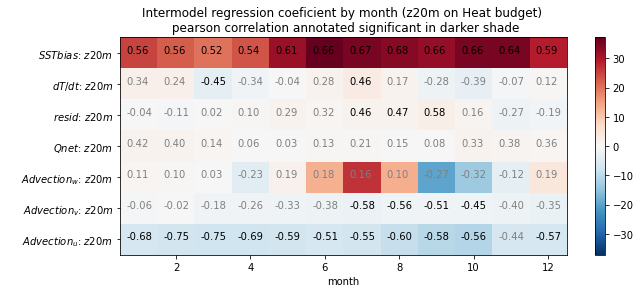

In [48]:
plot_regress_corr_wind(DS_NWA, zw_NWA, 'z20m')

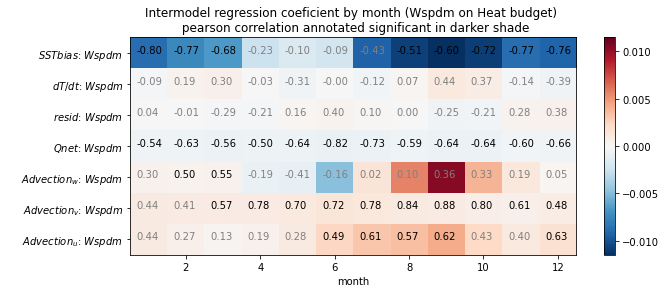

In [49]:
plot_regress_corr_wind(DS_NWA, zw_NWA, 'Wspdm')

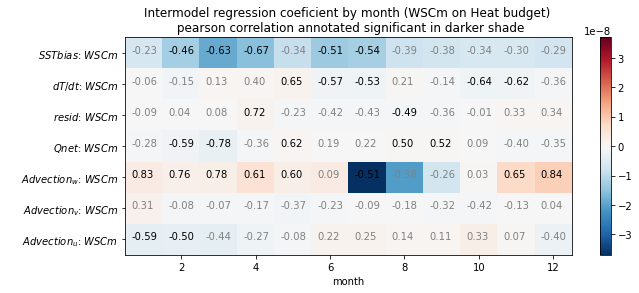

In [50]:
plot_regress_corr_wind(DS_NWA, zw_NWA, 'WSCm')

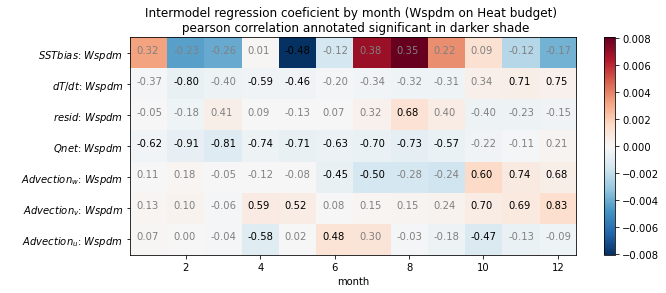

In [40]:
plot_regress_corr_wind(DS_sctr, zw_sctr, 'Wspdm')

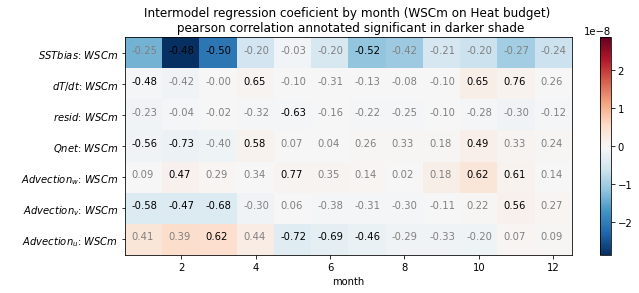

In [41]:
plot_regress_corr_wind(DS_sctr, zw_sctr, 'WSCm')

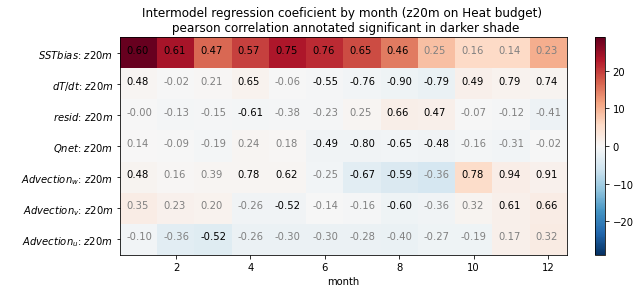

In [42]:
plot_regress_corr_wind(DS_sctr, zw_sctr, 'z20m')

In [ ]:
####

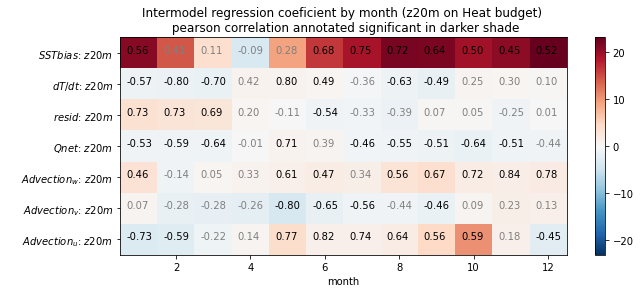

In [86]:
plot_regress_corr_wind(DS_WTIO, zw_WTIO, 'z20m')

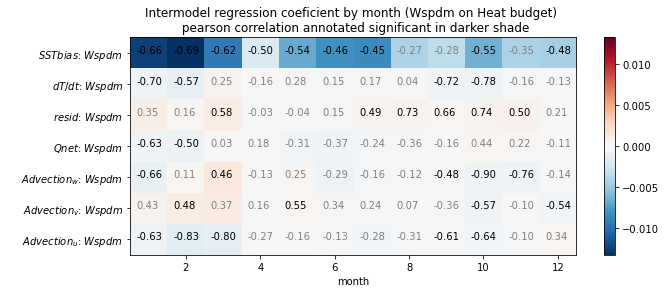

In [41]:
plot_regress_corr_wind(DS_SETIO, zw_SETIO, 'Wspdm')

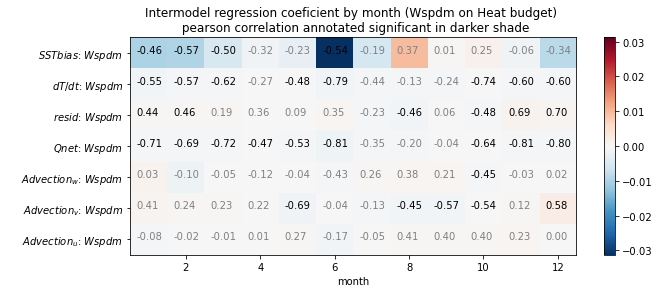

In [42]:
plot_regress_corr_wind(DS_ARAB, zw_ARAB, 'Wspdm')

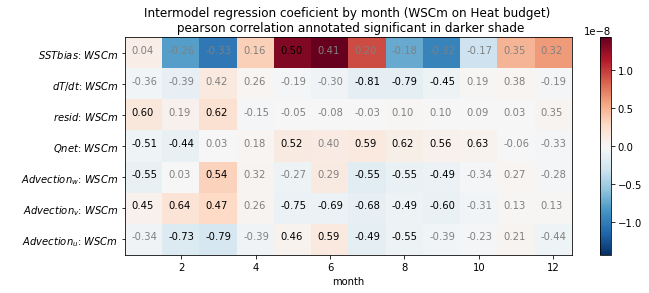

In [43]:
plot_regress_corr_wind(DS_SETIO, zw_SETIO, 'WSCm')

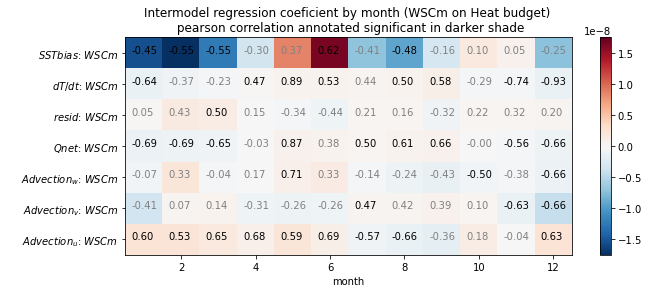

In [44]:
plot_regress_corr_wind(DS_WTIO, zw_WTIO, 'WSCm')

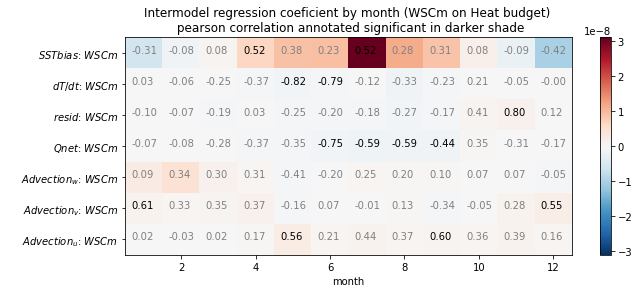

In [45]:
plot_regress_corr_wind(DS_ARAB, zw_ARAB, 'WSCm')

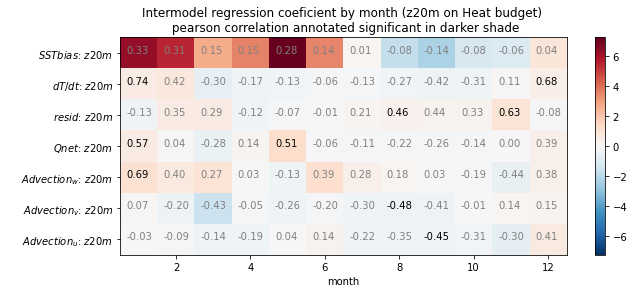

In [46]:
plot_regress_corr_wind(DS_SETIO, zw_SETIO, 'z20m')

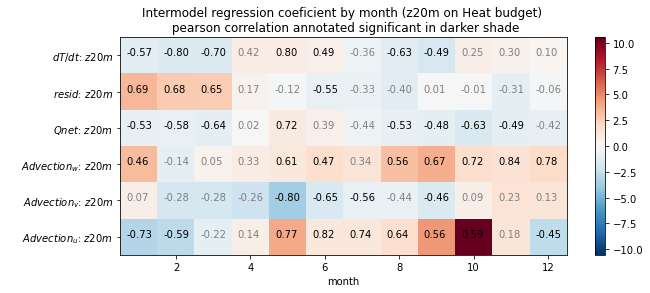

In [53]:
plot_regress_corr_wind(DS_WTIO, zw_WTIO, 'z20m')

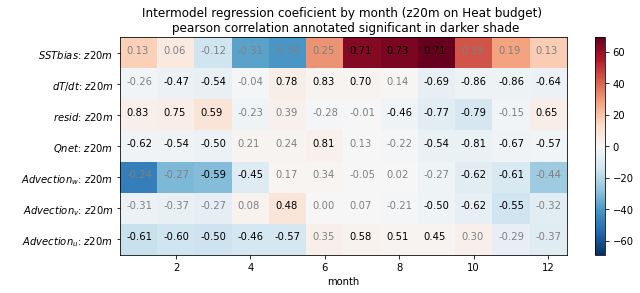

In [48]:
plot_regress_corr_wind(DS_ARAB, zw_ARAB, 'z20m')

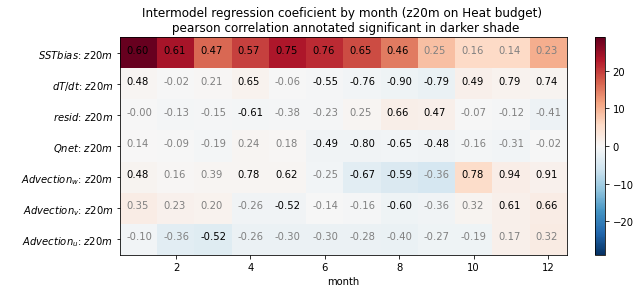

In [49]:
plot_regress_corr_wind(DS_sctr, zw_sctr, 'z20m')

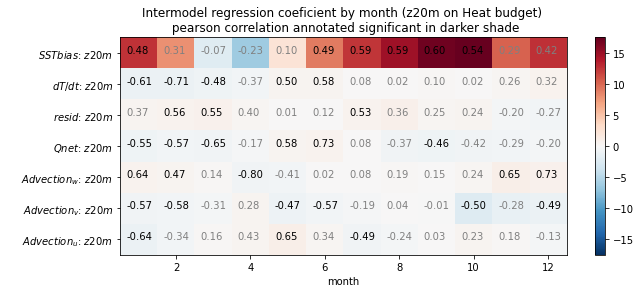

In [134]:
plot_regress_corr_wind(DS_weq, zw_weq, 'z20m')

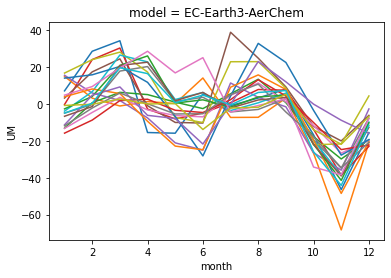

In [135]:
plt.figure()
for i, mod in enumerate(DS_weq['UM']):
    mod.plot()
#zw_WTIO['z20m']

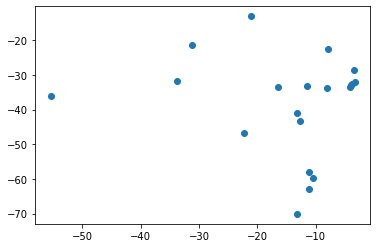

In [159]:
#plot WTIO w adv and TC depth
plt.scatter(DS_WTIO['UM'][:,6], DS_WTIO['TM'][:,6])

In [31]:
#load in argo z20 and soda z20
Az20 = xr.open_mfdataset("/home/z5113258/Documents/data/CMIP6_HB/ARGO/ARGO_z20.nc").TEMP
S20 = xr.open_mfdataset("/home/z5113258/Documents/SODA3.4.2/z20/*.nc").temp

In [32]:
S20 = S20.groupby('time.month').mean('time').sel(lat=slice(-40,30),lon=slice(30,125))

In [228]:
Az20

<xarray.DataArray 'TEMP' (month: 12, lat: 70, lon: 95)>
dask.array<open_dataset-7a5c65c68207a0d4587ee78de6e6508eTEMP, shape=(12, 70, 95), dtype=float32, chunksize=(12, 70, 95), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float32 30.5 31.5 32.5 33.5 34.5 ... 121.5 122.5 123.5 124.5
  * lat      (lat) float32 -39.5 -38.5 -37.5 -36.5 -35.5 ... 26.5 27.5 28.5 29.5
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12

In [33]:
#####Make plot of the Z20 isotherm MMM in models
#look at dtdx*U and check if cycle is the same
#fucntion to create regional plots for multimodel mean of each variable
def plot_region_z20m(MM_D, lat, lat_r, lon, lon_r):
    #create a 'model-series' for each variable
    for i, model in enumerate(MM_D.keys()):
        VARS = MM_D[model]
        z20=VARS['z20']
        #now turn all these variables into an array
        if i == 0:
            z20m = z20
        else:
            z20m = xr.concat([z20m, z20], dim = 'model')
    #Now calculate the multimodel means/
    z20mm = z20m.median(dim = 'model')
    #get the spatial average of these
    #TM = get_region(TM, lat, lat_r, lon, lon_r)
    #NOW LETS PLOT
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(8, 4), sharex='all')
    fig.set_facecolor('white')

    axes.plot(range(1,13), get_region((-1*z20mm), lat, lat_r, lon, lon_r), label = 'CMIP6 MMM')
    axes.fill_between(range(1,13), get_region(((-1*z20m.quantile(0.25, 'model'))), lat, lat_r, lon, lon_r),
                      get_region(((-1*z20m.quantile(0.75, 'model'))), lat, lat_r, lon, lon_r), 
                      alpha = 0.25)
    axes.plot(range(1,13), get_region((-1*Az20), lat, lat_r, lon, lon_r), label = 'ARGO')
    axes.plot(range(1,13), get_region((-1*S20), lat, lat_r, lon, lon_r), label = 'SODA3.4.2')
    axes.legend()

    return fig


/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


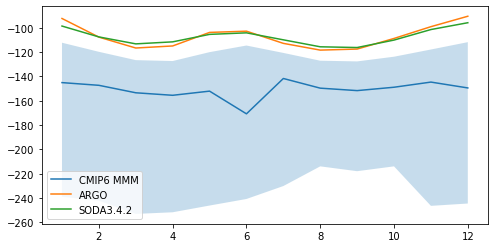

In [40]:
a=plot_region_z20m(mods_WTC, -10, 10, 50, 70)

/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


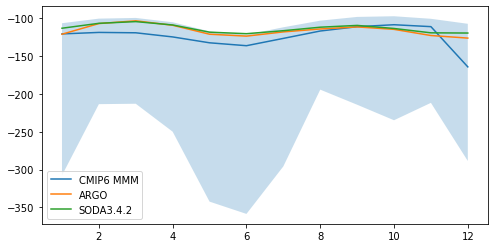

In [41]:
a=plot_region_z20m(mods_WTC, -10, 0, 90, 110)

/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1389: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


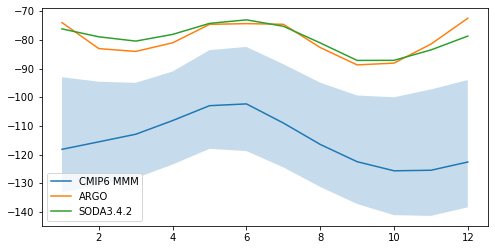

In [240]:
a=plot_region_z20m(mods_WTC, -10, -7, 50, 70)

In [233]:
mods_WTC

{'CanESM5': {'Wspd': <xarray.DataArray (month: 12, lat: 60, lon: 260)>
  [187200 values with dtype=float32]
  Coordinates:
    * lon      (lon) float64 30.5 31.5 32.5 33.5 34.5 ... 286.5 287.5 288.5 289.5
    * lat      (lat) float64 -29.5 -28.5 -27.5 -26.5 -25.5 ... 26.5 27.5 28.5 29.5
    * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12,
  'WSC': <xarray.DataArray (month: 12, lat: 60, lon: 260)>
  [187200 values with dtype=float64]
  Coordinates:
    * lon      (lon) float64 30.5 31.5 32.5 33.5 34.5 ... 286.5 287.5 288.5 289.5
    * lat      (lat) float64 -29.5 -28.5 -27.5 -26.5 -25.5 ... 26.5 27.5 28.5 29.5
    * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12,
  'z20': <xarray.DataArray 'thetao' (month: 12, lat: 60, lon: 95)>
  array([[[      nan,       nan, ...,       nan,       nan],
          [      nan,       nan, ...,       nan,       nan],
          ...,
          [      nan,       nan, ..., 61.984547, 77.101654],
          [      nan,       nan, ...,       nan, 46.06206

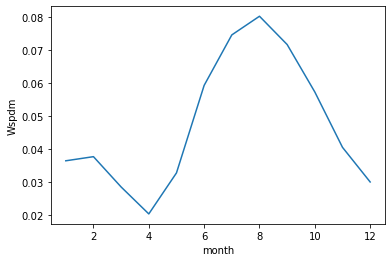

In [49]:
zw_SETIO['Wspdm'].mean('model').plot()

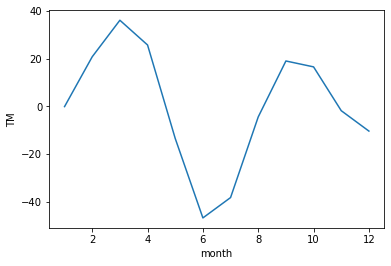

In [70]:
DS_WTIO['TM'].mean('model').plot()

In [40]:
models1['CanESM5'].keys()

dict_keys(['dTdt', 'ua', 'va', 'wa', 'q', 'res', 'SST'])

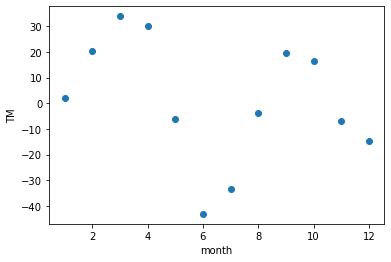

In [74]:
DS_WTIO.median('model').plot.scatter('month', y = 'TM')

[-5.00691461] [[-0.1251338]]
[12.48966198] [[-0.35849307]]
[27.90271974] [[-0.62846244]]
[40.68492205] [[0.20659315]]
[-0.83814582] [[-0.21940756]]
[-44.58614875] [[-0.51090618]]
[-36.01500434] [[-0.41756742]]
[-6.39440313] [[-0.23220035]]
[9.78445] [[0.0138292]]
[8.22002006] [[0.5646124]]
[0.41446456] [[0.65373812]]
[-5.79755948] [[0.3123649]]


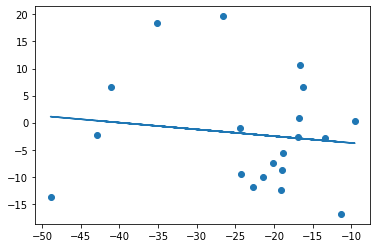

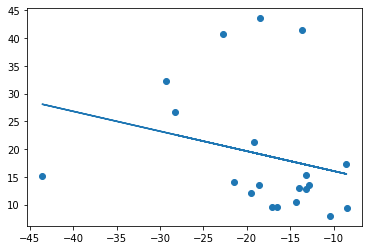

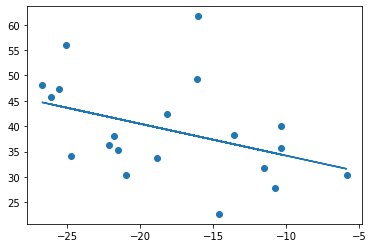

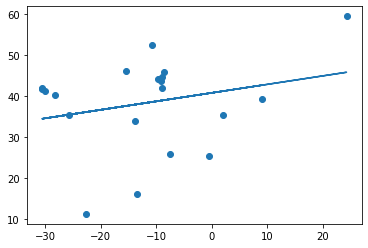

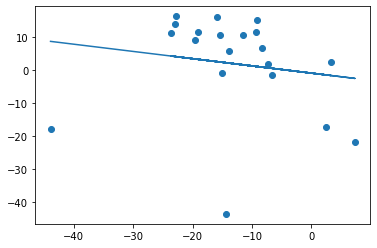

...

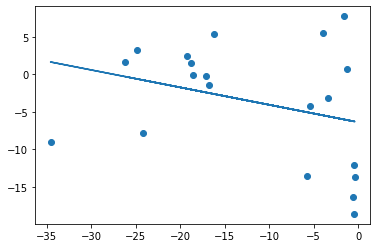

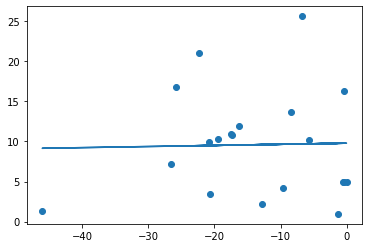

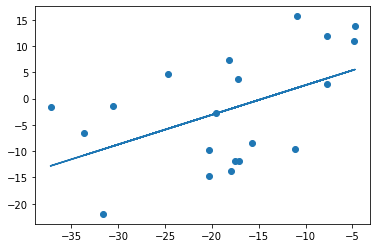

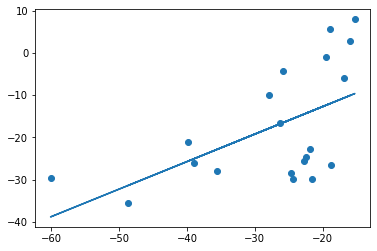

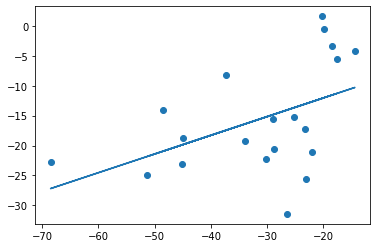

In [45]:
from sklearn.linear_model import LinearRegression
for i in range(0,12):
    regr = LinearRegression().fit(DS_EQ.WM[:,i].values.reshape(-1, 1), DS_EQ.TM[:,i].values.reshape(-1, 1))
    print(regr.intercept_, regr.coef_)
    plt.figure()
    plt.scatter(DS_EQ.WM[:,i].values.reshape(-1, 1), DS_EQ.TM[:,i].values.reshape(-1, 1))
    x = DS_EQ.WM[:,i].values.reshape(-1, 1)
    
    m = regr.coef_
    b= regr.intercept_


    plt.plot(x, m*x + b)

In [ ]:
#scatter ploits of certian months

In [73]:
TO, UO, VO, WO, QO, RO = get_obs_TS(OBS1)
TM, UM, VM, WM, QM, RM, SST = get_model_TS(models1)


0 GODAS
1 ORAS5
2 SODA3.4.2


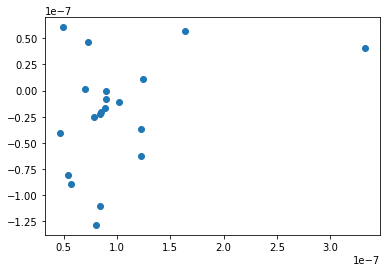

In [80]:
plt.scatter(get_region(VM[:,7], -10, 10, 50, 70), get_region(TM[:,7], -10, 10, 50, 70))

In [77]:
marks = ['o', '+', 'x', '*', '.']
colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']
test ={}
count = 0
for col in colors:
    for mark in marks:
        test[count] = [mark, col]
        count = count+1

In [78]:
from sklearn.linear_model import LinearRegression
def plot_regress(OBS, mods, lat, latr, lon, lonr):
    TO, UO, VO, WO, QO, RO = get_obs_TS(OBS)
    TM, UM, VM, WM, QM, RM, SST = get_model_TS(mods)
    
    tu = regress(get_region(TM*(3986*1026*50), lat, latr, lon, lonr), 
                 get_region(UM*(3986*1026*50), lat, latr, lon, lonr)).assign_coords({"var":1})
    tv = regress(get_region(TM*(3986*1026*50), lat, latr, lon, lonr), 
                 get_region(VM*(3986*1026*50), lat, latr, lon, lonr)).assign_coords({"var":1})
    tw = regress(get_region(TM*(3986*1026*50), lat, latr, lon, lonr), 
                 get_region(WM*(3986*1026*50), lat, latr, lon, lonr)).assign_coords({"var":1})
    tq = regress(get_region(TM*(3986*1026*50), lat, latr, lon, lonr), 
                 get_region(QM*(3986*1026*50), lat, latr, lon, lonr)).assign_coords({"var":1})
    tr = regress(get_region(TM*(3986*1026*50), lat, latr, lon, lonr), 
                 get_region(RM*(3986*1026*50), lat, latr, lon, lonr)).assign_coords({"var":1})

    #NOW MAKE A SCATTER PLOT FOR EACH MONTH AND VARIABLE COMBO
    for var in [UM]:
        SSTB = SST-OSST
        for month in range(0,12):
            plt.figure()
            for i, name in enumerate(TM.model.values):
                plt.scatter(get_region(var, lat, latr, lon, lonr)[i, month],
                            get_region(SSTB, lat, latr, lon, lonr)[i, month], 
                            c=test[i][1], marker=test[i][0], label = name)
            regr = LinearRegression().fit(get_region(var, lat, latr, lon, lonr)[:, month].values.reshape(-1, 1),
                                              get_region(SSTB, lat, latr, lon, lonr)[:, month].values.reshape(-1, 1))
            x = get_region(var, lat, latr, lon, lonr)[:, month].values.reshape(-1, 1)
            m = regr.coef_
            b= regr.intercept_
            plt.plot(x, (m*x + b), c = 'k', alpha = 0.5, lw = 0.7)
            ru = xs.pearson_r(get_region(var, lat, latr, lon, lonr)[:, month], 
                              get_region(SSTB, lat, latr, lon, lonr)[:, month], dim = 'model')

            #plt.text(bbox_to_anchor=(0.05, 1), str(regr.coef_[:3]))
            plt.title('Month = '+str(month+1)+'\n regression coefficient = '+str(regr.coef_)+'\n Pearson r = '+str(ru.values) )
            plt.xlabel('Qnet')
            plt.ylabel('SST bias')
            plt.axvline(get_region(QO[0][month], lat, latr, lon, lonr), alpha = 0.5, ls = '--', c = 'tab:purple', label = 'GODAS')
            plt.axvline(get_region(QO[1][month], lat, latr, lon, lonr), alpha = 0.5, ls = '--', c = 'tab:olive', label = 'ORAS5')
            plt.axvline(get_region(QO[2][month], lat, latr, lon, lonr), alpha = 0.5, ls = '--', c = 'tab:cyan', label = 'SODA3.4.2')
            plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

 
    DA1 = xr.concat([tu, tv, tw, tq, tr], dim = "var")
    #DA1.plot.imshow()#plto colors where significant
    #plt.yticks([1,2,3,4,5],['$dT/dt$:$Advection_{u}$','$dT/dt$:$Advection_{v}$',
    #                        '$dT/dt$:$Advection_{w}$','$dT/dt$:$Qnet$','$dT/dt$:$resid$',])#plot variables corerlated
    #plt.ylabel(' ')
    #plt.title("Intermodel regression coeficient by month ")
    return

0 GODAS
1 ORAS5
2 SODA3.4.2


/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/z5113258/anaconda3/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.

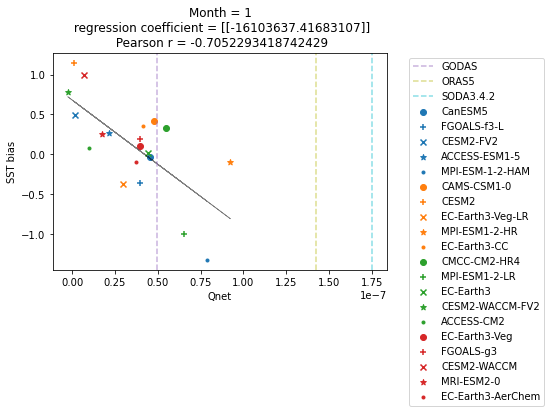

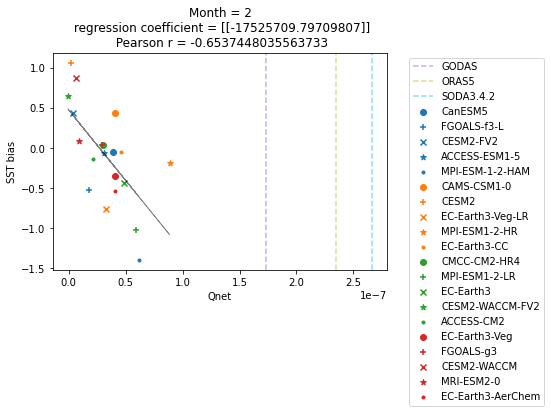

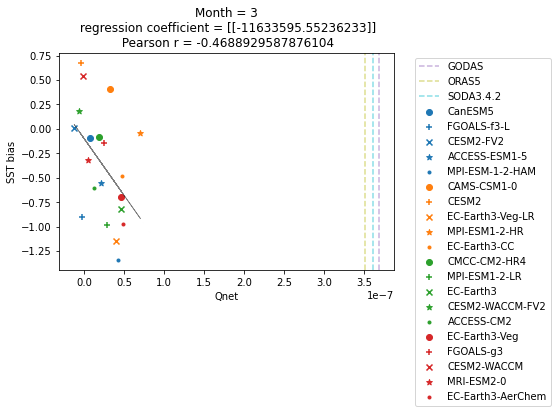

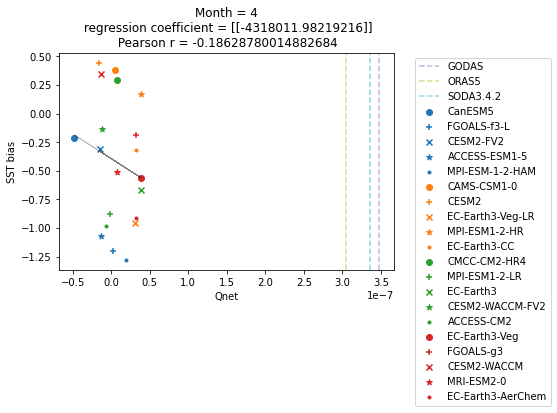

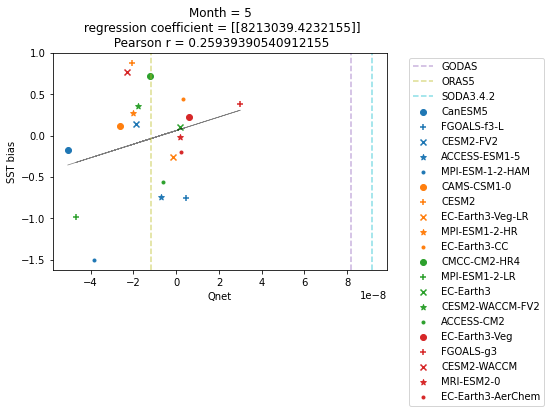

...

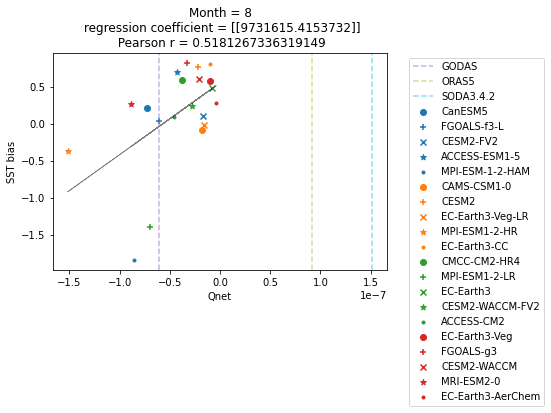

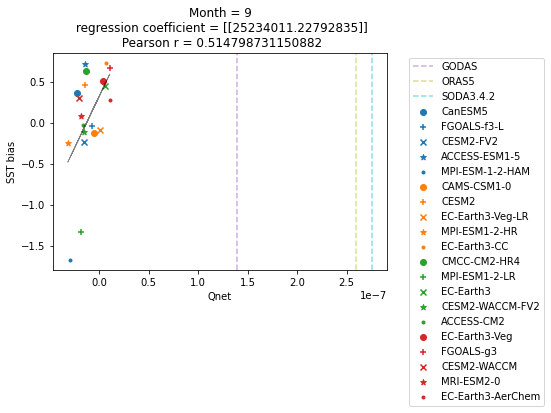

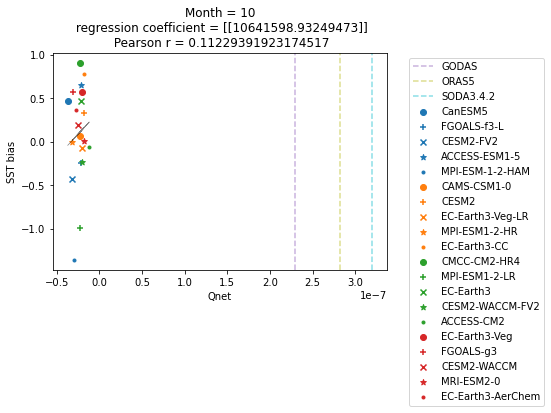

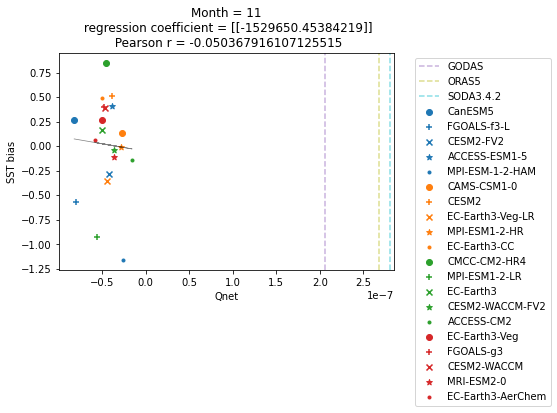

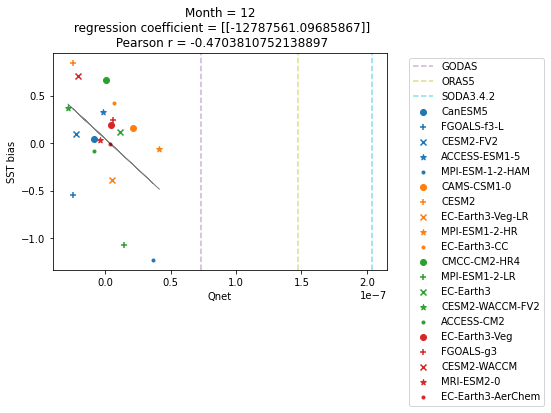

In [79]:
plot_regress(OBS1, models1, -10, 10, 50, 70)#u adv with vert bars

0 GODAS
1 ORAS5
2 SODA3.4.2


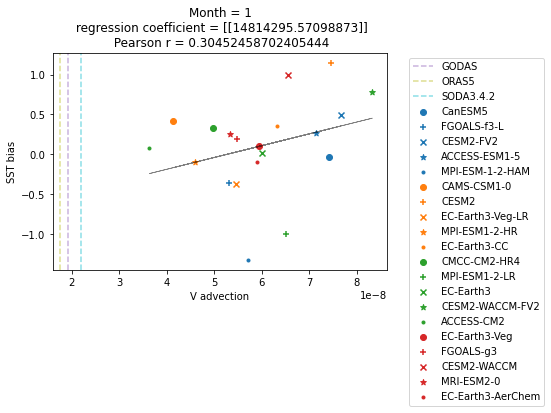

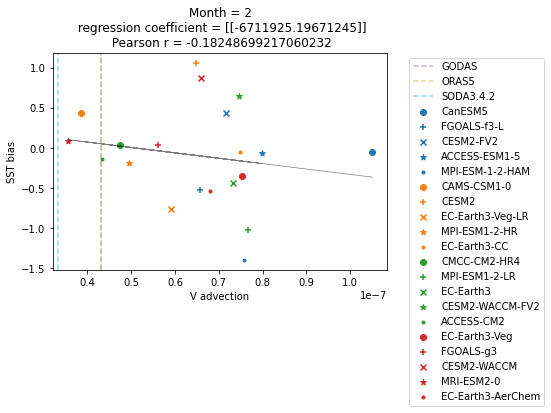

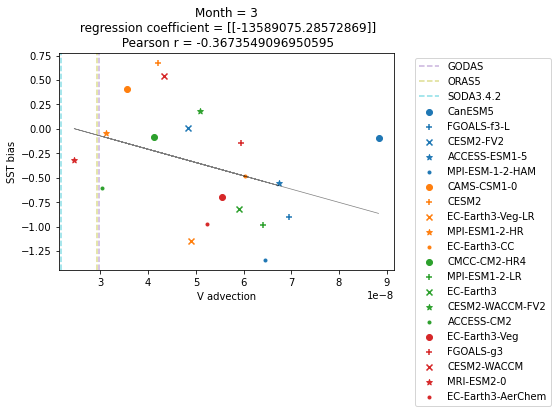

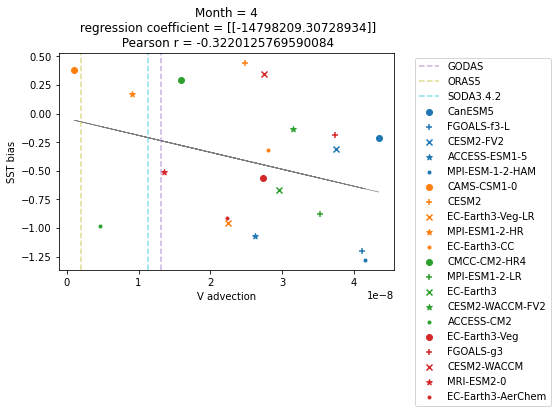

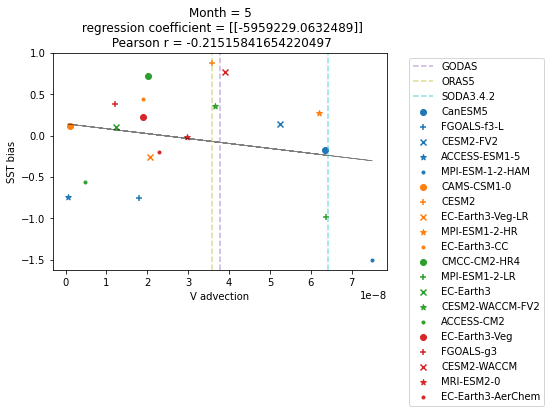

...

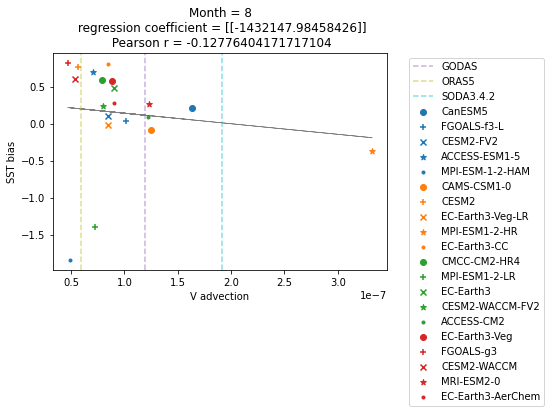

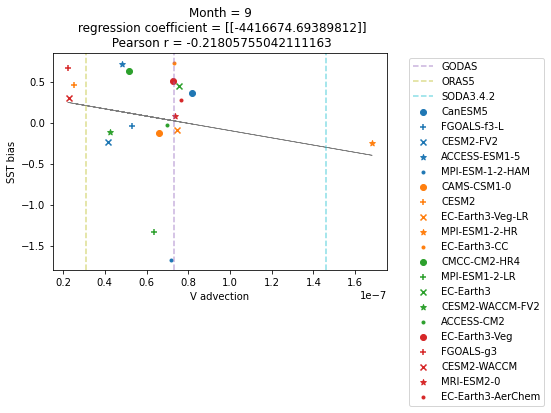

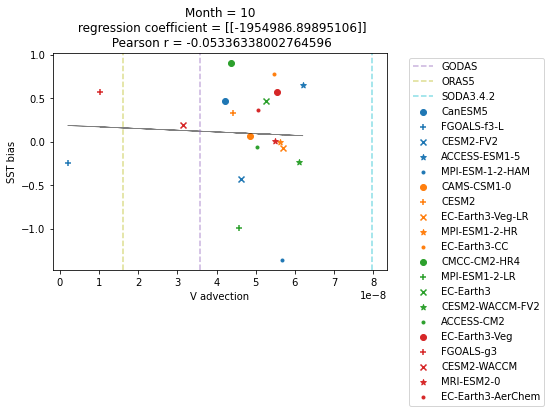

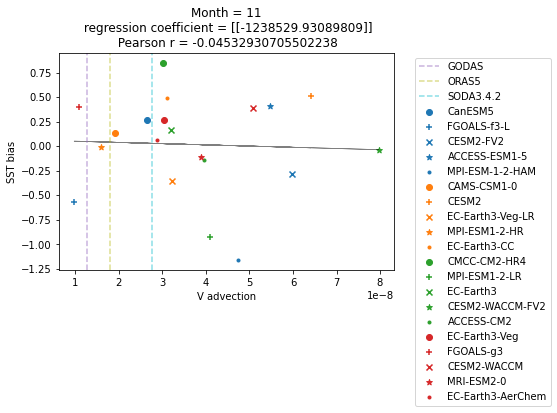

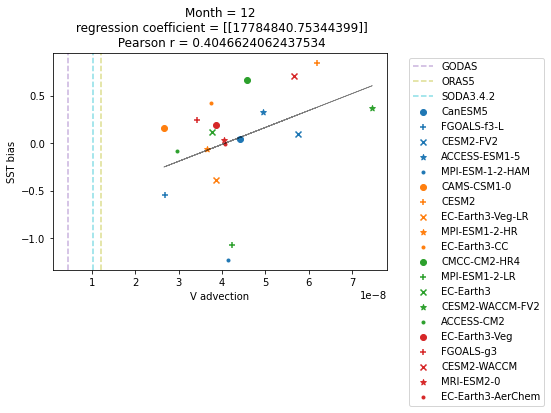

In [76]:
plot_regress(OBS1, models1, -10, 10, 50, 70)#v adv


0 GODAS
1 ORAS5
2 SODA3.4.2


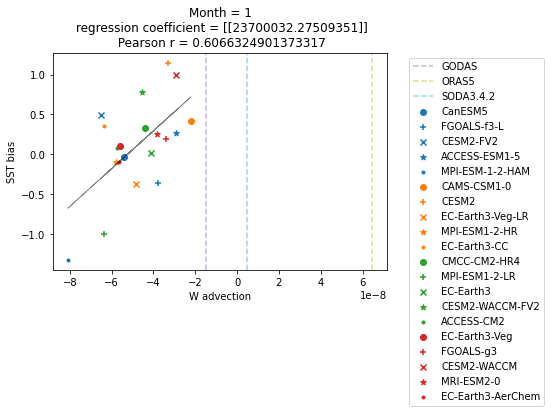

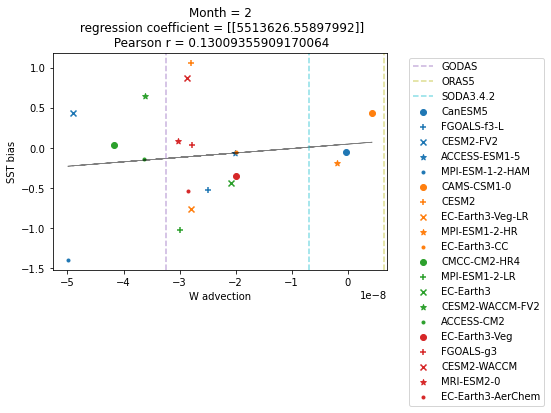

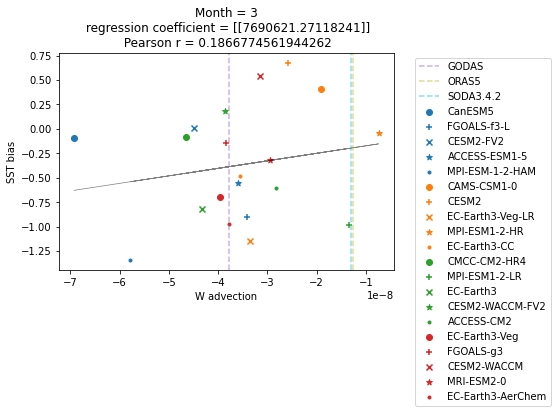

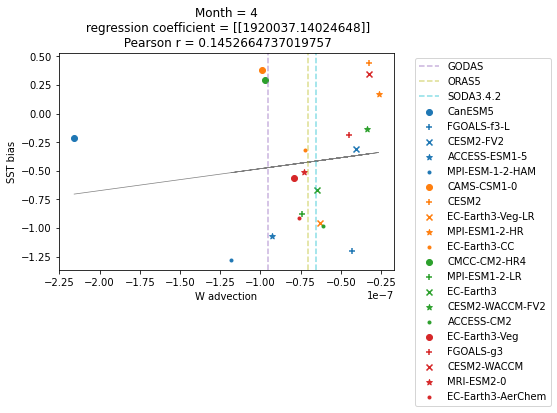

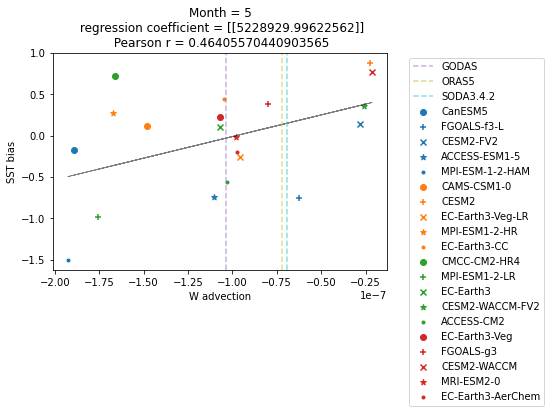

...

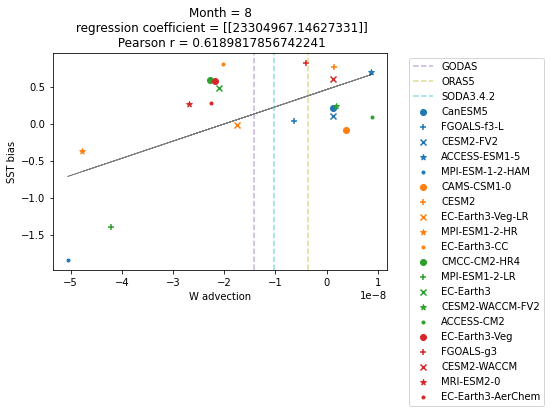

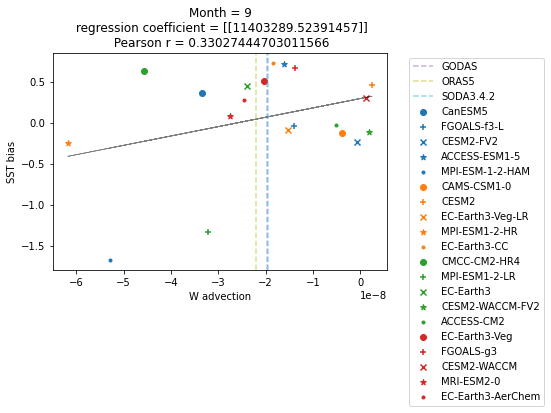

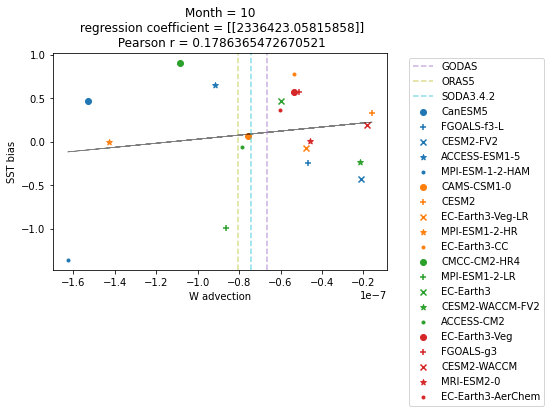

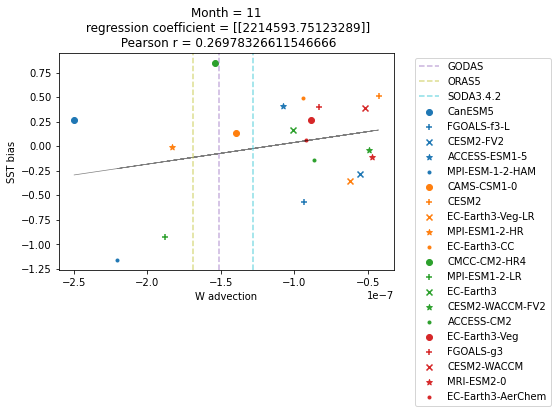

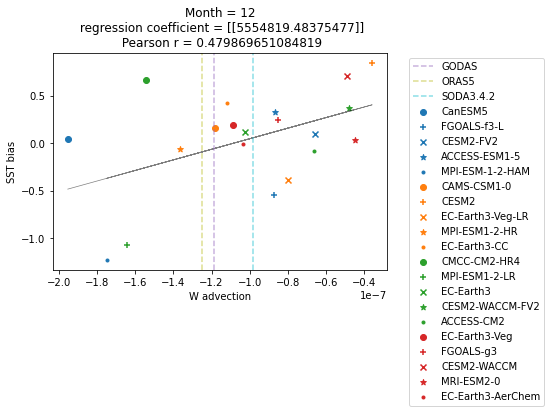

In [78]:
plot_regress(OBS1, models1, -10, 10, 50, 70)#w adv


0 GODAS
1 ORAS5
2 SODA3.4.2


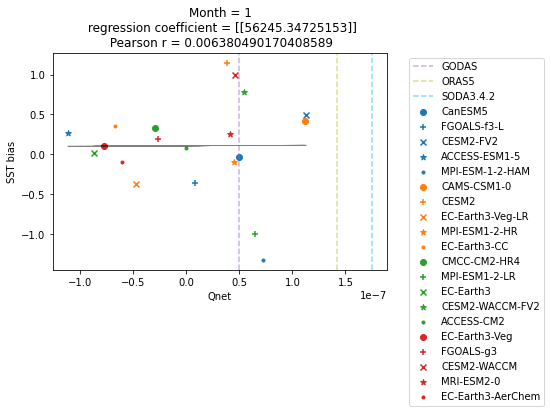

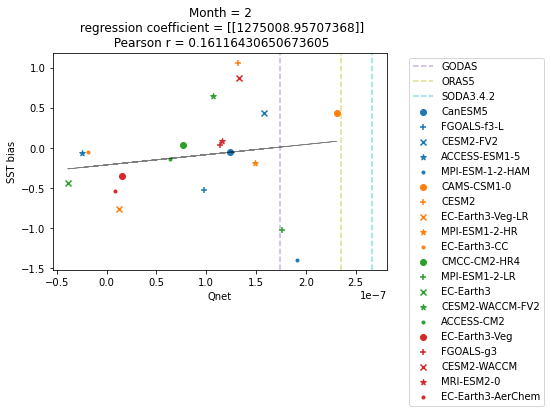

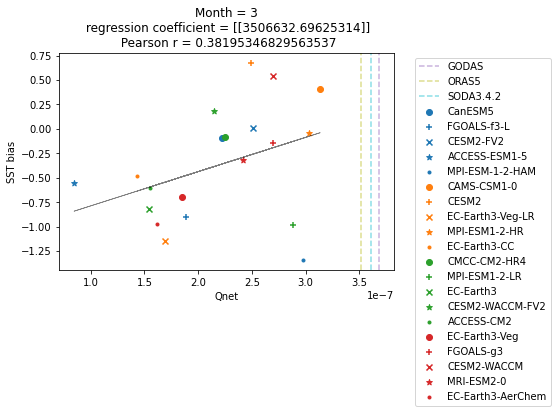

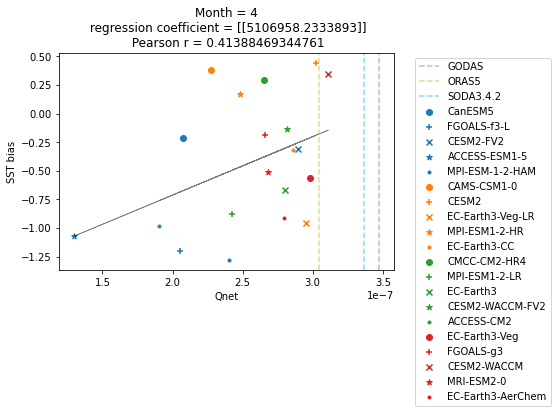

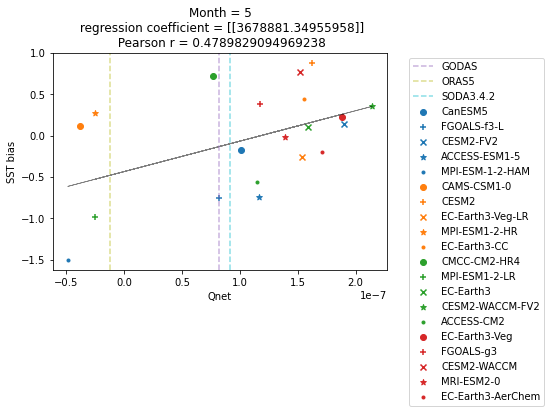

...

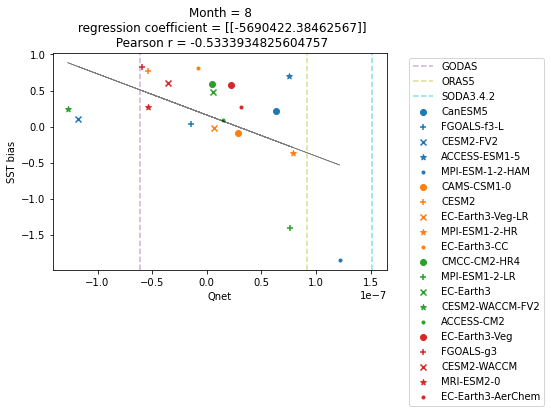

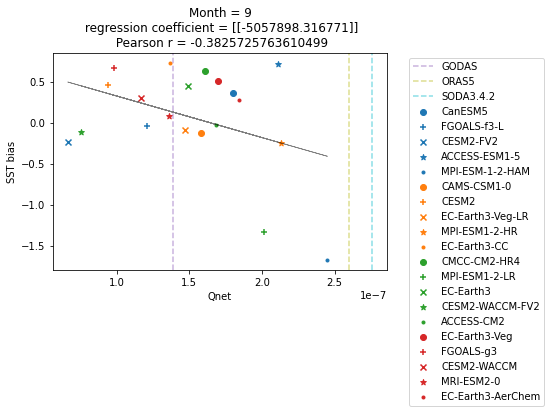

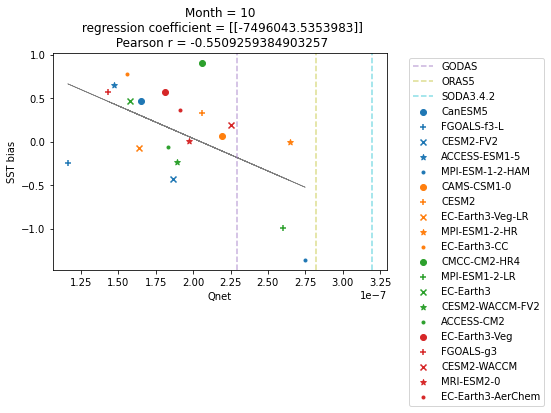

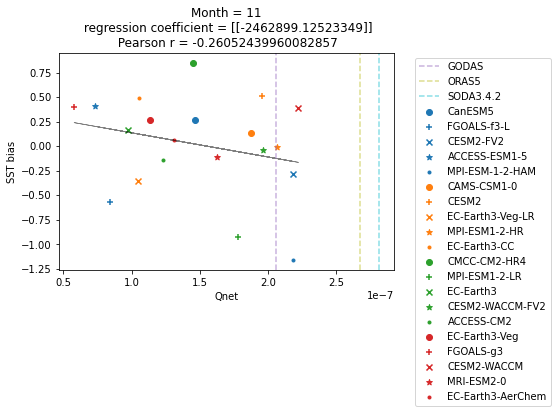

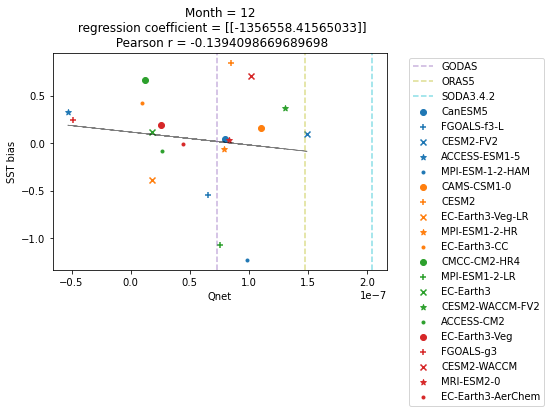

In [82]:
plot_regress(OBS1, models1, -10, 10, 50, 70)#Q

In [53]:
TM, UM, VM, WM, QM, RM = get_obs_TS(OBS1)


0 GODAS
1 ORAS5
2 SODA3.4.2


In [56]:
for i in TM:
    print(i.model)

<xarray.DataArray 'model' ()>
array('GODAS', dtype='<U9')
Coordinates:
    model    <U9 'GODAS'
<xarray.DataArray 'model' ()>
array('ORAS5', dtype='<U9')
Coordinates:
    model    <U9 'ORAS5'
<xarray.DataArray 'model' ()>
array('SODA3.4.2', dtype='<U9')
Coordinates:
    model    <U9 'SODA3.4.2'


In [11]:
TM, UM, VM, WM, QM, RM = get_model_TS(OBS1)
#calc monthly std dev for each term
TM = TM.std('model')
UM = UM.std('model')
VM = VM.std('model')
WM = WM.std('model')
QM = QM.std('model')
RM = RM.std('model')
mstd={'dTdt':TM, 'ua':UM, 'va':VM,'wa':WM, 'q':QM, 'res':RM}

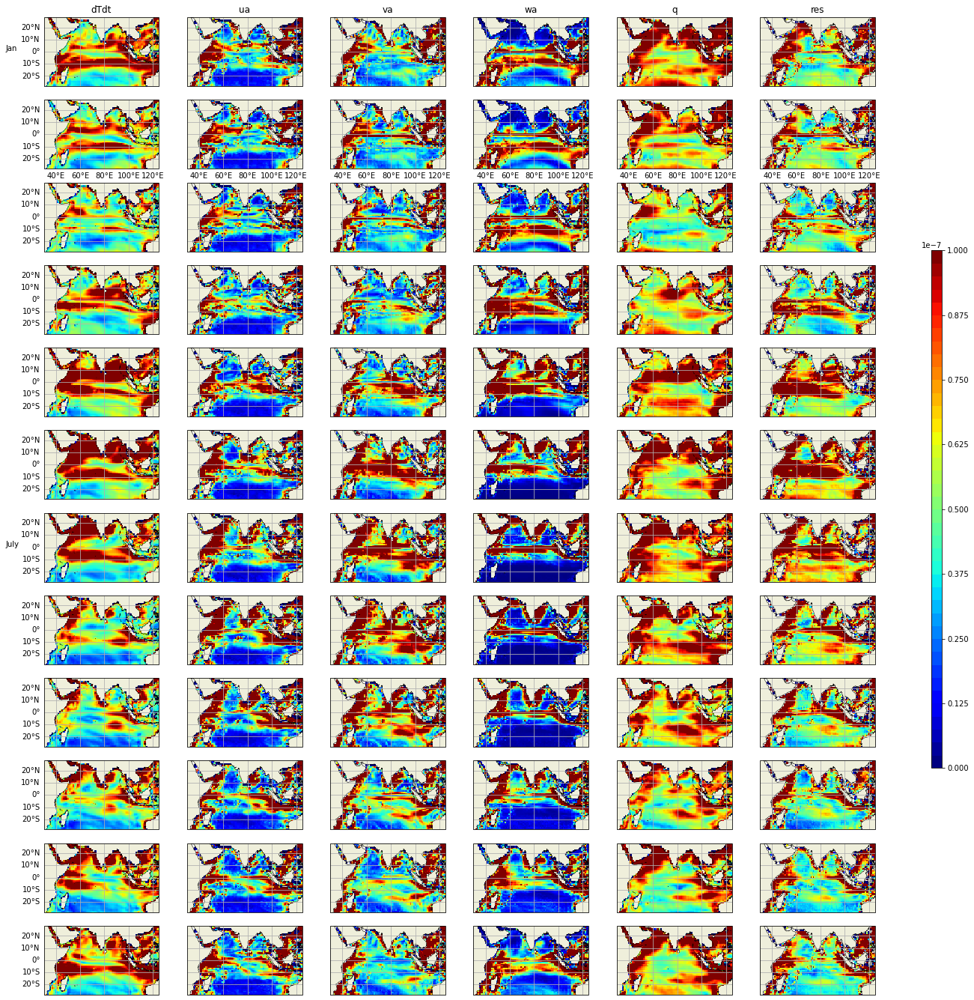

In [17]:
fig = plot_1(mstd, 0, 1e-7)

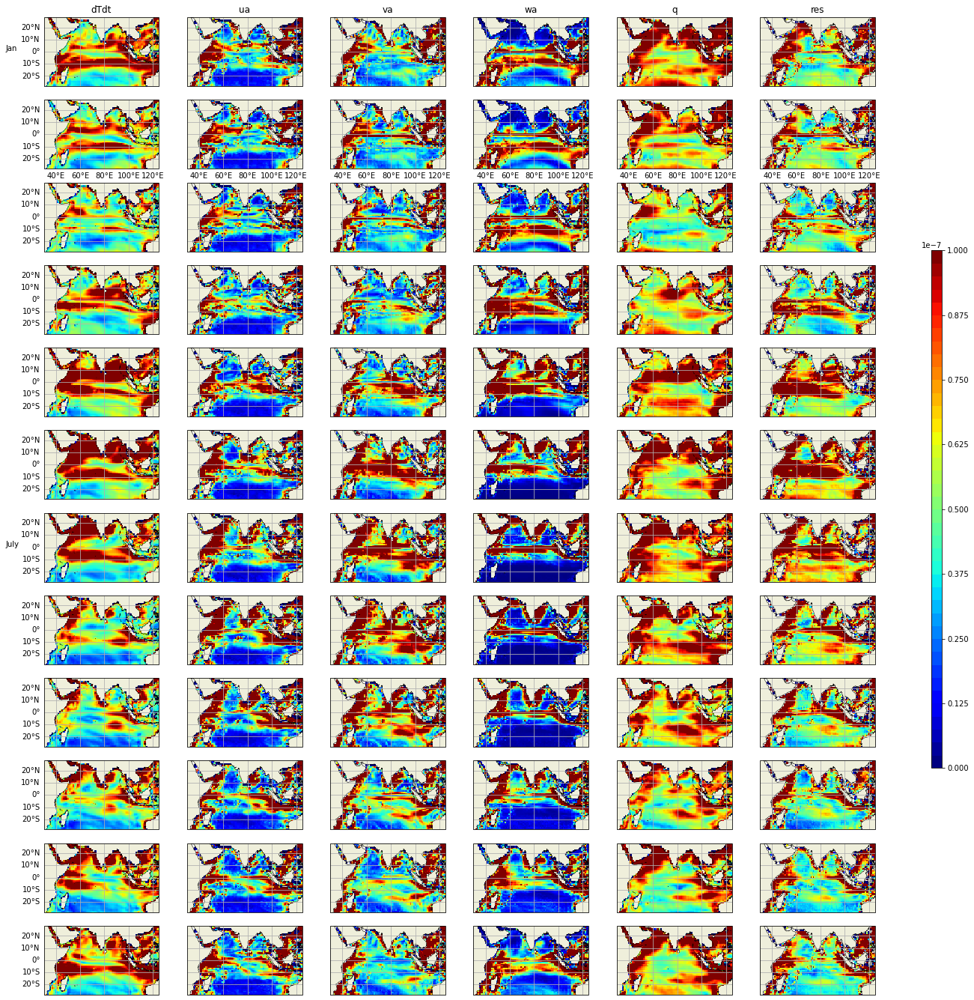

In [18]:
TM, UM, VM, WM, QM, RM = get_model_TS(models1)
#calc monthly std dev for each term
TM = TM.std('model')
UM = UM.std('model')
VM = VM.std('model')
WM = WM.std('model')
QM = QM.std('model')
RM = RM.std('model')
mstd={'dTdt':TM, 'ua':UM, 'va':VM,'wa':WM, 'q':QM, 'res':RM}
fig = plot_1(mstd, 0, 1e-7)

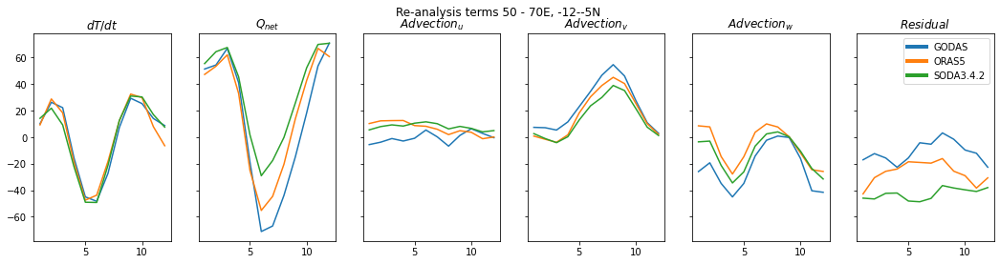

In [28]:
#just plot Obs
TO, UO, VO, WO, QO, RO = get_model_TS(OBS1)
lat=-12
lat_r = -5
lon = 50
lon_r = 70
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(18, 4), sharey='all', sharex='all')
axes[0].plot(range(1,13), get_region((TO[0]*(3986*1026*50)), lat, lat_r, lon, lon_r), label = 'Temperature tendency')
axes[1].plot(range(1,13), get_region((QO[0]*(3986*1026*50)), lat, lat_r, lon, lon_r), label = 'Qnet')
axes[2].plot(range(1,13), get_region((UO[0])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-U Advection')
axes[3].plot(range(1,13), get_region((VO[0])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-V Advection')
axes[4].plot(range(1,13), get_region((WO[0])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-W Advection')
axes[5].plot(range(1,13), get_region((RO[0])*(3986*1026*50), lat, lat_r, lon, lon_r), label = 'Residual')

axes[0].plot(range(1,13), get_region((TO[1]*(3986*1026*50)), lat, lat_r, lon, lon_r), label = 'Temperature tendency')
axes[1].plot(range(1,13), get_region((QO[1]*(3986*1026*50)), lat, lat_r, lon, lon_r), label = 'Qnet')
axes[2].plot(range(1,13), get_region((UO[1])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-U Advection')
axes[3].plot(range(1,13), get_region((VO[1])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-V Advection')
axes[4].plot(range(1,13), get_region((WO[1])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-W Advection')
axes[5].plot(range(1,13), get_region((RO[1])*(3986*1026*50), lat, lat_r, lon, lon_r), label = 'Residual')

axes[0].plot(range(1,13), get_region((TO[2]*(3986*1026*50)), lat, lat_r, lon, lon_r), label = 'Temperature tendency')
axes[1].plot(range(1,13), get_region((QO[2]*(3986*1026*50)), lat, lat_r, lon, lon_r), label = 'Qnet')
axes[2].plot(range(1,13), get_region((UO[2])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-U Advection')
axes[3].plot(range(1,13), get_region((VO[2])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-V Advection')
axes[4].plot(range(1,13), get_region((WO[2])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-W Advection')
axes[5].plot(range(1,13), get_region((RO[2])*(3986*1026*50), lat, lat_r, lon, lon_r), label = 'Residual')
axes[0].set_title('$dT/dt$')
axes[1].set_title('$Q_{net}$')
axes[2].set_title('$Advection_{u}$')
axes[3].set_title('$Advection_{v}$')
axes[4].set_title('$Advection_{w}$')
axes[5].set_title('$Residual$')
fig.suptitle(f"Re-analysis terms {lon} - {lon_r}E, {lat}-{lat_r}N")
from matplotlib.lines import Line2D

legend_elements = [Line2D([0], [0], color='tab:blue', lw=4, label='GODAS'),
                   Line2D([0], [0], color='tab:orange', lw =4, label='ORAS5'),
                   Line2D([0], [0], color='tab:green', lw =4, label='SODA3.4.2')]
axes[5].legend(handles=legend_elements)

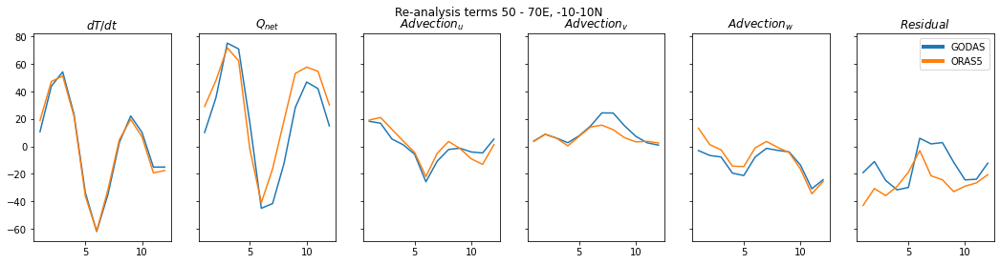

In [18]:
#just plot Obs
TO, UO, VO, WO, QO, RO = get_model_TS(OBS1)
lat=-10
lat_r = 10
lon = 50
lon_r = 70
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(18, 4), sharey='all', sharex='all')
axes[0].plot(range(1,13), get_region((TO[0]*(3986*1026*50)), lat, lat_r, lon, lon_r), label = 'Temperature tendency')
axes[1].plot(range(1,13), get_region((QO[0]*(3986*1026*50)), lat, lat_r, lon, lon_r), label = 'Qnet')
axes[2].plot(range(1,13), get_region((UO[0])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-U Advection')
axes[3].plot(range(1,13), get_region((VO[0])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-V Advection')
axes[4].plot(range(1,13), get_region((WO[0])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-W Advection')
axes[5].plot(range(1,13), get_region((RO[0])*(3986*1026*50), lat, lat_r, lon, lon_r), label = 'Residual')

axes[0].plot(range(1,13), get_region((TO[1]*(3986*1026*50)), lat, lat_r, lon, lon_r), label = 'Temperature tendency')
axes[1].plot(range(1,13), get_region((QO[1]*(3986*1026*50)), lat, lat_r, lon, lon_r), label = 'Qnet')
axes[2].plot(range(1,13), get_region((UO[1])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-U Advection')
axes[3].plot(range(1,13), get_region((VO[1])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-V Advection')
axes[4].plot(range(1,13), get_region((WO[1])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-W Advection')
axes[5].plot(range(1,13), get_region((RO[1])*(3986*1026*50), lat, lat_r, lon, lon_r), label = 'Residual')
axes[0].set_title('$dT/dt$')
axes[1].set_title('$Q_{net}$')
axes[2].set_title('$Advection_{u}$')
axes[3].set_title('$Advection_{v}$')
axes[4].set_title('$Advection_{w}$')
axes[5].set_title('$Residual$')
fig.suptitle(f"Re-analysis terms {lon} - {lon_r}E, {lat}-{lat_r}N")
from matplotlib.lines import Line2D

legend_elements = [Line2D([0], [0], color='tab:blue', lw=4, label='GODAS'),
                   Line2D([0], [0], color='tab:orange', lw =4, label='ORAS5')]
axes[5].legend(handles=legend_elements)

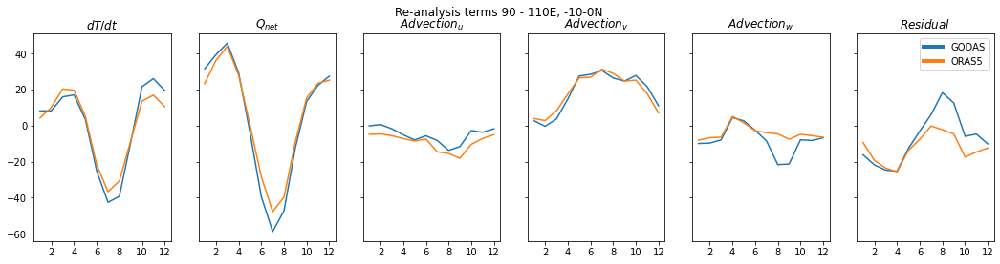

In [41]:
#just plot Obs
TO, UO, VO, WO, QO, RO = get_model_TS(OBS1)
lat=-10
lat_r = 0
lon = 90
lon_r = 110
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(18, 4), sharey='all', sharex='all')
axes[0].plot(range(1,13), get_region((TO[0]*(3986*1026*50)), lat, lat_r, lon, lon_r), label = 'Temperature tendency')
axes[1].plot(range(1,13), get_region((QO[0]*(3986*1026*50)), lat, lat_r, lon, lon_r), label = 'Qnet')
axes[2].plot(range(1,13), get_region((UO[0])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-U Advection')
axes[3].plot(range(1,13), get_region((VO[0])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-V Advection')
axes[4].plot(range(1,13), get_region((WO[0])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-W Advection')
axes[5].plot(range(1,13), get_region((RO[0])*(3986*1026*50), lat, lat_r, lon, lon_r), label = 'Residual')

axes[0].plot(range(1,13), get_region((TO[1]*(3986*1026*50)), lat, lat_r, lon, lon_r), label = 'Temperature tendency')
axes[1].plot(range(1,13), get_region((QO[1]*(3986*1026*50)), lat, lat_r, lon, lon_r), label = 'Qnet')
axes[2].plot(range(1,13), get_region((UO[1])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-U Advection')
axes[3].plot(range(1,13), get_region((VO[1])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-V Advection')
axes[4].plot(range(1,13), get_region((WO[1])*(3986*1026*50), lat, lat_r, lon, lon_r), label = '-W Advection')
axes[5].plot(range(1,13), get_region((RO[1])*(3986*1026*50), lat, lat_r, lon, lon_r), label = 'Residual')
axes[0].set_title('$dT/dt$')
axes[1].set_title('$Q_{net}$')
axes[2].set_title('$Advection_{u}$')
axes[3].set_title('$Advection_{v}$')
axes[4].set_title('$Advection_{w}$')
axes[5].set_title('$Residual$')
fig.suptitle(f"Re-analysis terms {lon} - {lon_r}E, {lat}-{lat_r}N")
from matplotlib.lines import Line2D

legend_elements = [Line2D([0], [0], color='tab:blue', lw=4, label='GODAS'),
                   Line2D([0], [0], color='tab:orange', lw =4, label='ORAS5')]
axes[5].legend(handles=legend_elements)
axes[0].set_xticks(range(2,14,2))
